# Project - CreditCard Users Churn Prediction

# **Background and Context:**

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged on every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers’ and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help bank improve their services so that customers do not renounce their credit cards

# **Objective:**

1. Explore and visualize the dataset.
2. Build a classification model to predict if the customer is going to churn or not
3. Optimize the model using appropriate techniques
4. Generate a set of insights and recommendations that will help the bank

# **Data Description/Dictionary:**

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then 1 else 0
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

## Index

[1 - Perform an Exploratory Data Analysis](#11)

[2 - Illustrate the Insights based on EDA](#22)

[3 - Data Pre-processing](#33)

[4 - Model Building - Logistic Regression](#44)

[5 - Model Building - Bagging and Boosting](#55)

[6 - Hyperparameter Tuning using Grid Search](#66)

[7 - Hyperparameter Tuning using Random Search](#77)

[8 - Model Performances](#88)

[9 - Actionable Insights & Recommendations](#99)

#### Install Packages

In [ ]:
pip install --upgrade numpy

In [ ]:
pip install --upgrade pandas

In [ ]:
pip install --upgrade matplotlib

In [ ]:
pip install --upgrade seaborn

In [ ]:
pip install --upgrade sklearn

In [ ]:
pip install --upgrade xgboost

In [ ]:
pip install --upgrade scikit-plot

In [ ]:
pip install --upgrade imblearn

#### Importing Libraries

In [9]:
import warnings
warnings.filterwarnings("ignore")

from time import time
import numpy as np   
import pandas as pd    

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.pipeline import make_pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from xgboost import XGBClassifier

from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold, cross_val_score

from sklearn.inspection import plot_partial_dependence

import scikitplot as skplt
import scipy.stats as stats
from scipy.stats import randint as sp_randint

from sklearn.inspection import plot_partial_dependence

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

#### Creating Library of Functions

In [10]:
# Function used to Create a Combo Plot with a Boxplot and a Histogram

def histogram_boxplot(feature):
    sns.set({'figure.figsize': (12, 6)})
    sns.set_style("whitegrid")
    sns.set_style("ticks")
    sns.set_context("notebook")
    fig, (ax1, ax2) = plt.subplots(nrows = 2, sharex = True, gridspec_kw = {"height_ratios": (.25, .75)})
    sns.boxplot(feature, showmeans = True, color='violet', ax = ax1)
    g = sns.histplot(feature, bins = 50, ax = ax2, kde = True)
    g.axvline(np.mean(feature), color = 'green', linestyle = '--') # Add mean to the histogram
    g.axvline(np.median(feature), color = 'black', linestyle = '-') # Add median to the histogram

In [11]:
# Function used to Create a Combo Plot with a Histogram (hue on Target categories) and 02 Boxplots for a variable of interest and the target variable (with and without outliers) 

def combo_plot(feature, target, nbins):
    sns.set_style("whitegrid")
    sns.set_style("ticks")
    sns.set_context("notebook")
    
    fig,axs = plt.subplots(1, 3, figsize=(14, 5))
     
    sns.histplot(data[(data[target] == 0)][feature], ax = axs[0], color = 'darkblue', kde = True, bins = nbins)
    sns.histplot(data[(data[target] == 1)][feature], ax = axs[0], color = 'darkorange', kde = True, bins = nbins)
       
    axs[1].set_title('Boxplot - Target')
    sns.boxplot(data[target], data[feature], ax = axs[1], palette = 'gist_rainbow', showmeans = True)
    axs[2].set_title('Boxplot - Target - Without Outliers')
    sns.boxplot(data[target], data[feature], ax = axs[2], showfliers = False, palette = 'gist_rainbow', showmeans = True)
    plt.tight_layout();

In [12]:
# Countplots with Percentages (Univariate Analysis & Bivariate Analysis)
# Combo Countplot with overall Percentages (top graph) and Percentages Split (based on the 'hue' variable) within each Category (bottom graph)

def percentage_on_bar(feature, hue, data, order, hue_order):
    sns.set({'figure.figsize': (20, 10)})
    sns.set_style("whitegrid")
    sns.set_style("ticks")
    sns.set_context("notebook")
    total = len(data[feature])
       
    fig, (ax1, ax2) = plt.subplots(nrows = 2, sharey = True)
    
    plt1 = sns.countplot(x = feature, data = data, order = order, hue_order = hue_order, ax = ax1)
    height1 = [0] * data[feature].nunique()
    counter = 0
    for p in plt1.patches:
        height1[counter] = p.get_height()
        plt1.text(p.get_x() + p.get_width() / 2, height1[counter] + 5, '{:1.2f}'.format(100 * height1[counter] / total) + "%", ha = "center")
        counter = counter + 1
        
    height1_hue = len(data[hue].value_counts()) * height1

    plt2 = sns.countplot(x = feature, hue = hue, data = data, order = order, hue_order = hue_order, ax = ax2)
    counter = 0
    for p in plt2.patches:
        height2 = p.get_height()
        plt2.text(p.get_x() + p.get_width() / 2, height2 + 5, '{:1.2f}'.format(100 * height2 / height1_hue[counter]) + "%", ha = "center")
        counter = counter + 1
    plt2.legend(loc = 'upper right', title = hue, framealpha = 1, shadow = True, borderpad = 1);

In [13]:
# Function to get a Confusion Matrix with Percentages

def make_confusion_matrix(model, y_test):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred, labels = [0, 1])
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = cm.flatten()
    group_percentages = np.round(100*group_counts/np.sum(group_counts), 2)
    
    labels = [f"{v1}\n{v2}\n{v3}%" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    
    plt.figure(figsize = (7,5))
    sns.set_context("talk")
    sns.heatmap(cm, annot = labels,  fmt = '', xticklabels = ["0", "1"] , yticklabels = ["0", "1"])
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

In [14]:
##  Function to Calculate Different Metric Scores of the Model - Accuracy, Recall, Precision, F1 Score and ROC AUC Score

def get_metrics_score(model, n_splits, seed_splits, flag = True):
    
    # defining the k-fold for calculation the cross-validation average reasults
    kfold = StratifiedKFold(n_splits = n_splits, random_state = seed_splits, shuffle = True)
        
    # defining an empty list to store train and test results
    score_list=[] 
    
    train_accuracy_avg = round(cross_val_score(model, X_train, y_train, cv = kfold, scoring = 'accuracy').mean(), 3)
    train_recall_avg = round(cross_val_score(model, X_train, y_train, cv = kfold, scoring = 'recall').mean(), 3)
    train_precision_avg = round(cross_val_score(model, X_train, y_train, cv = kfold, scoring = 'precision').mean(), 3)
    train_F1_score_avg = round(cross_val_score(model, X_train, y_train, cv = kfold, scoring = 'f1').mean(), 3)
    
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    test_accuracy = round(accuracy_score(y_test, y_pred_test), 3)
    test_recall = round(recall_score(y_test, y_pred_test), 3)
    test_precision = round(precision_score(y_test, y_pred_test), 3)
    test_F1_score = round(f1_score(y_test, y_pred_test), 3)
    ROC_AUC_score = round(roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]), 3)
      
    score_list.extend((train_accuracy_avg, test_accuracy, train_recall_avg, test_recall, train_precision_avg, test_precision, train_F1_score_avg, test_F1_score, ROC_AUC_score))
    
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True:
        print("Average Train Accuracy  =", train_accuracy_avg)
        print("Test Accuracy           =", test_accuracy)
        print("Average Train Recall    =", train_recall_avg)
        print("Test Recall             =", test_recall)
        print("Average Train Precision =", train_precision_avg)
        print("Test Precision          =", test_precision)
        print("Average Train F1 Score  =", train_F1_score_avg)
        print("Test F1 Score           =", test_F1_score)
        print("ROC AUC Score           =", ROC_AUC_score)
        
    return score_list # returning the list with train and test scores

In [15]:
##  Function to Calculate Features Importance

def features_importance(model):
    fi = pd.DataFrame(model.feature_importances_, columns = ["Importance"], index = X_train.columns).reset_index().sort_values(by = 'Importance', ascending = False)
    # Features Importance
    sns.set({'figure.figsize': (12, 12)})
    sns.set_style("whitegrid")
    sns.set_style("ticks")
    sns.set_context("notebook")
    total = fi['Importance'].sum()
    g = sns.barplot(x = "Importance", y = "index", order = fi['index'], orient = 'h', data = fi)
    sns.despine()
    for p in g.patches:
        g.text(x = p.get_width() + 0.0005, y = p.get_y() + p.get_height() / 2, s = '{:1.2f}'.format(100 * p.get_width() / total) + "%", va = "center")
    g.set(ylabel = None)
    plt.title('Features Importance');

***
## 1 - Perform an Exploratory Data Analysis<a class="anchor" id="11"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">

- Univariate analysis
- Bivariate analysis
- Use appropriate visualizations to identify the patterns and insights
- Any other exploratory deep dive

#### 1.1 - Load the Dataset, Chech First 05 Rows, Check Data Shape, Data Types, Number of Null Values and Unique Categories for each Variable

In [16]:
# Loading Dataset
data = pd.read_csv("BankChurners.csv")

In [17]:
# Checking First 05 Rows
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [18]:
# Checking Data Shape
data.shape

(10127, 21)

- There are total 21 columns and 10,127 rows in the dataset.

In [19]:
# Checking Data Types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

- The data types for all the columns are either integer, float or object.

- 'Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category' and 'Card_Category' are Object type (Categorical) variables.

In [20]:
# Checking Number of Missing Values per Variable
data.isnull().sum().sort_values(ascending = False)

CLIENTNUM                   0
Months_Inactive_12_mon      0
Total_Ct_Chng_Q4_Q1         0
Total_Trans_Ct              0
Total_Trans_Amt             0
Total_Amt_Chng_Q4_Q1        0
Avg_Open_To_Buy             0
Total_Revolving_Bal         0
Credit_Limit                0
Contacts_Count_12_mon       0
Total_Relationship_Count    0
Attrition_Flag              0
Months_on_book              0
Card_Category               0
Income_Category             0
Marital_Status              0
Education_Level             0
Dependent_count             0
Gender                      0
Customer_Age                0
Avg_Utilization_Ratio       0
dtype: int64

- There aren't any missing values in the dataset.

In [21]:
# Check Unique Categories for each Variable
data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 7
Marital_Status                  4
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

- 'CLIENTNUM' has a unique value for each row in the dataset. This variable will be deleted as it is an ID variable and will not add value to the model.

- 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1' and 'Avg_Utilization_Ratio' are Numeric/Continuous variables since they are numeric and have several unique categories compared to the other variables.
- 'Customer_Age' and 'Months_on_book' are Numeric/Discrete variables with several unique categories compared to the other Numeric/Discrete variables.
- 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon' and 'Contacts_Count_12_mon' are Numeric/Discrete variables with fewer categories.
- 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category' and 'Card_Category' are Categorical/Nominal variables.
- 'Attrition_Flag' is a Categorical/Nominal variable, having 02 distinct categories. This variable is the Dependent Variable for the classification model.

In [22]:
# Dropping 'CLIENTNUM' from the Dataset
data.drop(columns = ['CLIENTNUM'], inplace = True)

- 'CLIENTNUM' variable was deleted from the dataset

In [23]:
# Check Uniques Categories Values per Variable
# Including the Dependent Variable: 'Attrition_Flag'
# Including Numeric/Discrete variables with less categories: 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon' and 'Contacts_Count_12_mon'
# Including Categorical/Nominal variables: 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category' and 'Card_Category'
cat_cols = ['Attrition_Flag', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon',\
            'Contacts_Count_12_mon', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

for column in cat_cols :
    print(data[column].value_counts(normalize = True))
    print()
    print('-'*30)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

------------------------------
3    0.269774
2    0.262170
1    0.181495
4    0.155426
0    0.089266
5    0.041868
Name: Dependent_count, dtype: float64

------------------------------
3    0.227609
4    0.188802
5    0.186729
6    0.184260
2    0.122741
1    0.089859
Name: Total_Relationship_Count, dtype: float64

------------------------------
3    0.379777
2    0.324084
1    0.220500
4    0.042954
5    0.017577
6    0.012244
0    0.002864
Name: Months_Inactive_12_mon, dtype: float64

------------------------------
3    0.333761
2    0.318653
1    0.148020
4    0.137454
0    0.039400
5    0.017379
6    0.005332
Name: Contacts_Count_12_mon, dtype: float64

------------------------------
F    0.529081
M    0.470919
Name: Gender, dtype: float64

------------------------------
Graduate         0.308877
High School      0.198776
Unknown          0.149995
Uneducated       0.146835
College       

- 'Attrition_Flag' is the Dependent Variable for the classification model, having 02 distinct categories: 'Existing Customer' and 'Attrited Customer'. There is a relevant imbalance on the 'Attrition Flag' categories, with 83.9% of data associated with 'Existing Customer' and 16.1% of the data associated with the 'Attrited Customer'.

- 'Dependent_count' is a Numerical/Discrete variable with 06 distinct categories ('0', '1', '2', '3', '4' and '5').
- 'Total_Relationship_Count' is a Numerical/Discrete variable with 06 distinct categories ('1', '2', '3', '4', '5' and '6').
- 'Months_Inactive_12_mon' and 'Contacts_Count_12_mon' are Numerical/Discrete variables with 07 distinct categories ('0', '1', '2', '3', '4', '5' and '6').
- 'Gender' is a Categorical/Nominal variable, having 02 distinct categories ('F' and 'M').
- 'Education_Level' is a Categorical/Nominal variable, having 07 distinct categories ('Unknown', 'Uneducated', 'High School', 'College', 'Graduate', 'Post-Graduate' and 'Doctorate').
- 'Marital_Status' is a Categorical/Nominal variable with 04 distinct categories ('Unknown', 'Single', 'Married' and 'Divorced').
- 'Income_Category' is a Categorical/Nominal variable, having 06 distinct categories ('Unknown', 'Less than \\$40K', '\\$40K - \\$60K', '\\$60K - \\$80K', '\\$80K - \\$120K' and '\\$120K +').
- 'Card_Category' is a Categorical/Nominal variable, having 04 distinct categories ('Blue', 'Silver', 'Gold' and 'Platinum').
- The 'Unknown' values for 'Education_Level' and 'Marital_Status' will be analyzed in more details more upfront. These missing values can be potentially treated by using a KNN imputation, however first it's required to confirm whether there is a relationship (correlation) between the variables with the missing/unknown values and other variables in the dataset.

#### 1.2 - Univariate Analysis for Numeric/Continuous

##### Univariate Analysis for 'Credit_Limit'

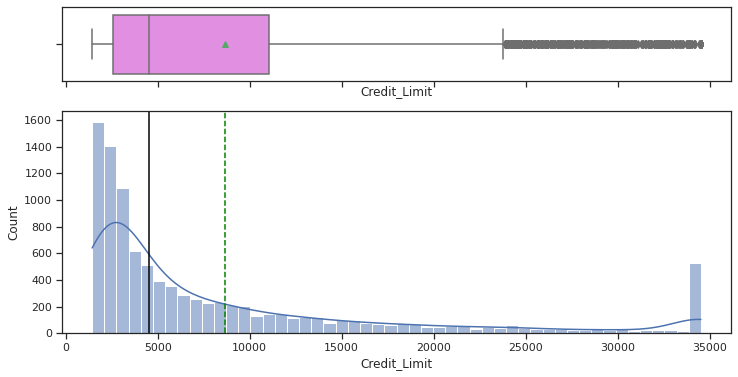

In [24]:
histogram_boxplot(data['Credit_Limit'])

In [25]:
# Top 10 Highest Values for 'Credit_Limit'
data['Credit_Limit'].nlargest(n = 5)

6     34516.0
45    34516.0
61    34516.0
65    34516.0
70    34516.0
Name: Credit_Limit, dtype: float64

In [26]:
print("There are {} data entries with 'Credit_Limit' of $34516, representing {}% of the total entries".format(len(data[(data['Credit_Limit'] == 34516)]),\
                                                                                                              round(100 * len(data[(data['Credit_Limit'] == 34516)]) / len(data), 2)))

There are 508 data entries with 'Credit_Limit' of $34516, representing 5.02% of the total entries


In [27]:
# Checking Descriptive Statistics and Skewness for 'Credit_Limit'
print(data[['Credit_Limit']].describe())
print()
print('Skewness', data[['Credit_Limit']].skew())

       Credit_Limit
count  10127.000000
mean    8631.953698
std     9088.776650
min     1438.300000
25%     2555.000000
50%     4549.000000
75%    11067.500000
max    34516.000000

Skewness Credit_Limit    1.666726
dtype: float64


- 'Credit_Limit' has a range from \\$1438.3 to \\$34516.0, a mean and median at \\$8632.0 and \\$4549.0, respectively. Also, its distribution is skewed to the right (skewness of 1.67).

- There are 508 data entries with 'Credit_Limit' of \\$34516, representing 5.02\% of the total entries.
- Because there's a relevant amount of data entries at \\$34516, it looks like the upper limit for the ditribution was capped at \\$34516.

##### Univariate Analysis for 'Total_Revolving_Bal'

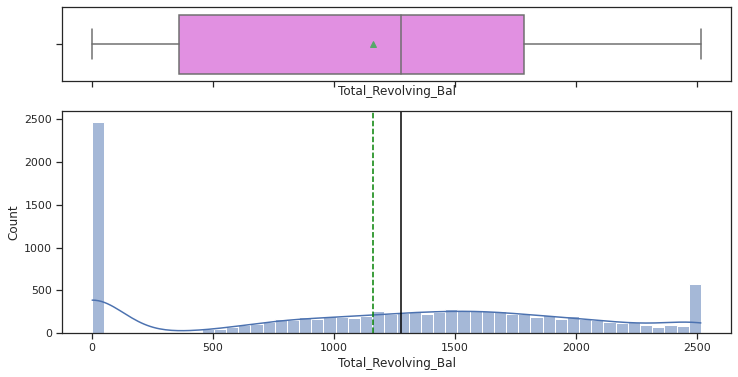

In [28]:
histogram_boxplot(data['Total_Revolving_Bal'])

In [29]:
# Top 10 Highest Values for 'Total_Revolving_Bal'
data['Total_Revolving_Bal'].nlargest(n = 5)

3     2517
8     2517
18    2517
32    2517
42    2517
Name: Total_Revolving_Bal, dtype: int64

In [30]:
print("There are {} data entries with 'Total_Revolving_Bal' of $2517, representing {}% of the total entries".format(len(data[(data['Total_Revolving_Bal'] == 2517)]),\
                                                                                                                    round(100 * len(data[(data['Total_Revolving_Bal'] == 2517)]) / len(data), 2)))

There are 508 data entries with 'Total_Revolving_Bal' of $2517, representing 5.02% of the total entries


In [31]:
# Top 10 Lowest Values for 'Total_Revolving_Bal'
data['Total_Revolving_Bal'].nsmallest(n = 5)

2     0
4     0
12    0
21    0
24    0
Name: Total_Revolving_Bal, dtype: int64

In [32]:
print("There are {} data entries with 'Total_Revolving_Bal' of $0, representing {}% of the total entries".format(len(data[(data['Total_Revolving_Bal'] == 0)]),\
                                                                                                                    round(100 * len(data[(data['Total_Revolving_Bal'] == 0)]) / len(data), 2)))

There are 2470 data entries with 'Total_Revolving_Bal' of $0, representing 24.39% of the total entries


In [33]:
# Checking Descriptive Statistics and Skewness for 'Total_Revolving_Bal'
print(data[['Total_Revolving_Bal']].describe())
print()
print('Skewness', data[['Total_Revolving_Bal']].skew())

       Total_Revolving_Bal
count         10127.000000
mean           1162.814061
std             814.987335
min               0.000000
25%             359.000000
50%            1276.000000
75%            1784.000000
max            2517.000000

Skewness Total_Revolving_Bal   -0.148837
dtype: float64


- 'Total_Revolving_Bal' has a range from \\$0.0 to \\$2517.0, a mean and median at \\$1162.8 and \\$1276.0, respectively. Also, its distribution doesn't exhibit a relevant degree of skewness (skewness of -0.15).

- There are 508 data entries with 'Total_Revolving_Bal' of \\$2517, representing 5.02\% of the total entries. Coincidently this is exactly the same amount of 'Credit_Limit' values of \\$34516.
- Because there's a relevant amount of data entries at \\$2517, it looks like the upper limit for the ditribution was capped at \\$2517.
- Also, there are 2470 data entries with 'Total_Revolving_Bal' of \\$0, representing 24.39\% of the total entries. This amount may be associated with the Customers who either paid their balances before the due date (meaning their charges won't carry over the next month) or didn't use the credit card for any purchases.

##### Univariate Analysis for 'Avg_Open_To_Buy'

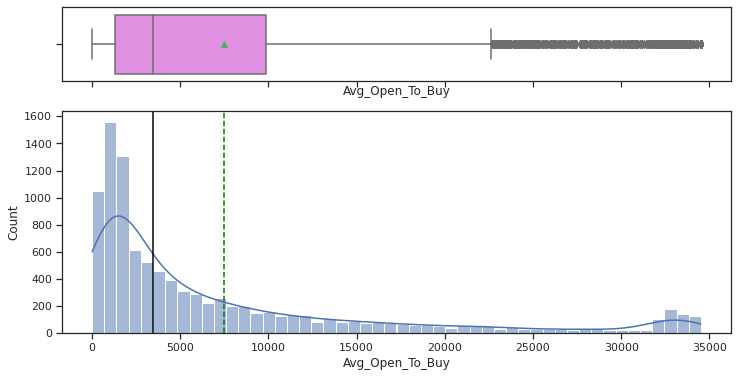

In [34]:
histogram_boxplot(data['Avg_Open_To_Buy'])

In [35]:
# Top 10 Lowest Values for 'Avg_Open_To_Buy'
data['Avg_Open_To_Buy'].nsmallest(n = 5)

4443     3.0
7649    10.0
1999    14.0
7955    14.0
1452    15.0
Name: Avg_Open_To_Buy, dtype: float64

In [36]:
# Checking Descriptive Statistics and Skewness for 'Total_Revolving_Bal'
print(data[['Avg_Open_To_Buy']].describe())
print()
print('Skewness', data[['Avg_Open_To_Buy']].skew())

       Avg_Open_To_Buy
count     10127.000000
mean       7469.139637
std        9090.685324
min           3.000000
25%        1324.500000
50%        3474.000000
75%        9859.000000
max       34516.000000

Skewness Avg_Open_To_Buy    1.661697
dtype: float64


- 'Avg_Open_To_Buy' has a range from \\$3.0 to \\$34516.0, a mean and median at \\$7469.1 and \\$3474.0, respectively. Also, its distribution is skewed to the right (skewness of 1.66).

- The distribution for 'Avg_Open_To_Buy' represents a bi-modal shape, with the left hand side of the distribution representing the average for the last 12 months of Customers who used most of their credit limit, and the second peak on the right hand side associated with the Customers who probably didn't use much of their credit limit over the last 12 months.

##### Univariate Analysis for 'Total_Amt_Chng_Q4_Q1'

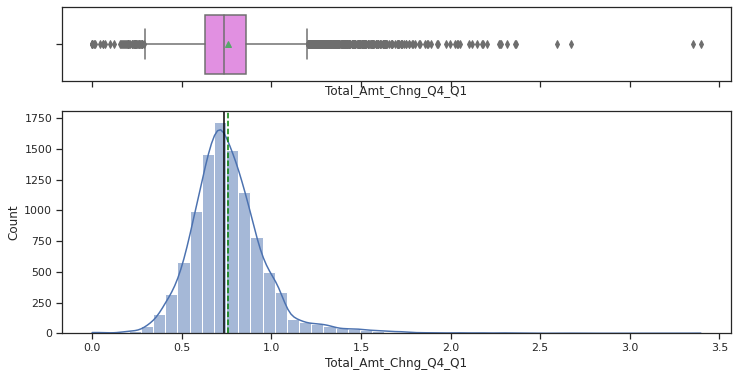

In [37]:
histogram_boxplot(data['Total_Amt_Chng_Q4_Q1'])

In [38]:
# Checking Descriptive Statistics and Skewness for 'Total_Amt_Chng_Q4_Q1'
print(data[['Total_Amt_Chng_Q4_Q1']].describe())
print()
print('Skewness', data[['Total_Amt_Chng_Q4_Q1']].skew())

       Total_Amt_Chng_Q4_Q1
count          10127.000000
mean               0.759941
std                0.219207
min                0.000000
25%                0.631000
50%                0.736000
75%                0.859000
max                3.397000

Skewness Total_Amt_Chng_Q4_Q1    1.732063
dtype: float64


- 'Total_Amt_Chng_Q4_Q1' has a range from 0.0 to 3.4, a mean and median at 0.76 and 0.74, respectively. Also, its distribution is skewed to the right (skewness of 1.73).

- Most os the values for 'Total_Amt_Chng_Q4_Q1' are smaller than 1.0, suggesting the Customers normally spend more money on Q1 than on Q4 (transaction_amount_Q4/transaction_amount_Q1 < 1.0).

##### Univariate Analysis for 'Total_Trans_Amt'

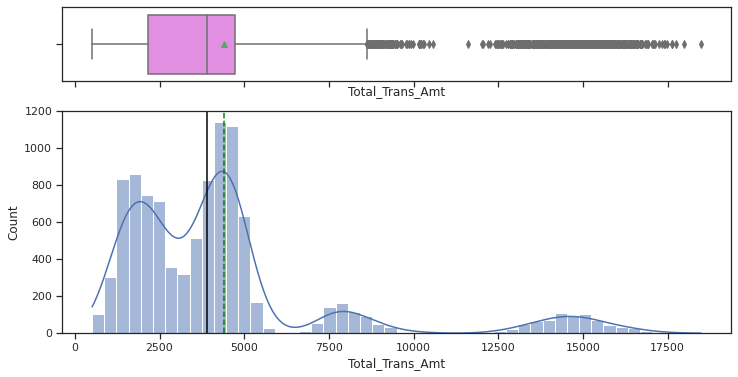

In [39]:
histogram_boxplot(data['Total_Trans_Amt'])

In [40]:
# Checking Descriptive Statistics and Skewness for 'Total_Trans_Amt'
print(data[['Total_Trans_Amt']].describe())
print()
print('Skewness', data[['Total_Trans_Amt']].skew())

       Total_Trans_Amt
count     10127.000000
mean       4404.086304
std        3397.129254
min         510.000000
25%        2155.500000
50%        3899.000000
75%        4741.000000
max       18484.000000

Skewness Total_Trans_Amt    2.041003
dtype: float64


- 'Total_Trans_Amt' has a range from \\$510.0 to \\$18484.0, a mean and median at \\$4404.1 and \\$3899.0, respectively. Also, its distribution is skewed to the right (skewness of 2.04).

- The distribution for 'Total_Trans_Amt' represents a quadri-modal shape, with 04 distinct peaks. This means we possibly have 04 distinct types of Customers expenditure ranges over 12 months.

##### Univariate Analysis for 'Total_Trans_Ct'

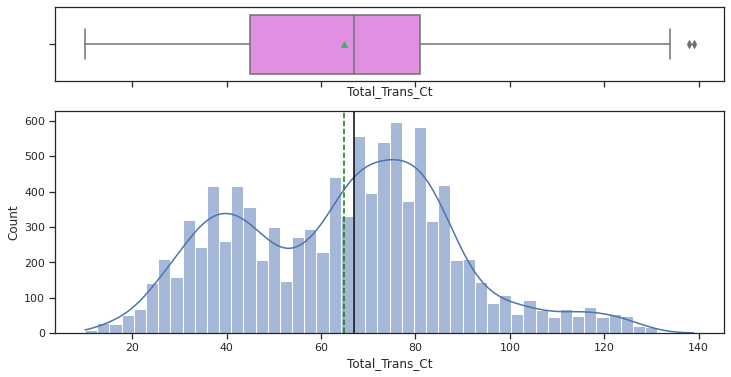

In [41]:
histogram_boxplot(data['Total_Trans_Ct'])

In [42]:
# Checking Descriptive Statistics and Skewness for 'Total_Trans_Ct'
print(data[['Total_Trans_Ct']].describe())
print()
print('Skewness', data[['Total_Trans_Amt']].skew())

       Total_Trans_Ct
count    10127.000000
mean        64.858695
std         23.472570
min         10.000000
25%         45.000000
50%         67.000000
75%         81.000000
max        139.000000

Skewness Total_Trans_Amt    2.041003
dtype: float64


- 'Total_Trans_Ct' has a range from 10 to 139, a mean and median at 64.86 and 67.0, respectively. Also, its distribution is skewed to the right (skewness of 2.04).

- The distribution for 'Total_Trans_Ct' is similar to the distribution for 'Total_Trans_Amt', meaning both variable might be correlated. This possible correlation will be checked in more details upfront.

##### Univariate Analysis for 'Total_Ct_Chng_Q4_Q1'

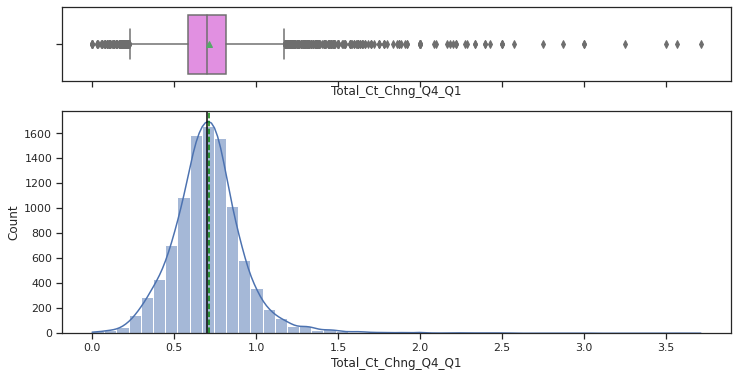

In [43]:
histogram_boxplot(data['Total_Ct_Chng_Q4_Q1'])

In [44]:
# Checking Descriptive Statistics and Skewness for 'Total_Ct_Chng_Q4_Q1'
print(data[['Total_Ct_Chng_Q4_Q1']].describe())
print()
print('Skewness', data[['Total_Ct_Chng_Q4_Q1']].skew())

       Total_Ct_Chng_Q4_Q1
count         10127.000000
mean              0.712222
std               0.238086
min               0.000000
25%               0.582000
50%               0.702000
75%               0.818000
max               3.714000

Skewness Total_Ct_Chng_Q4_Q1    2.064031
dtype: float64


- 'Total_Ct_Chng_Q4_Q1' has a range from 0.0 to 3.7, a mean and median at 0.71 and 0.70, respectively. Also, its distribution is skewed to the right (skewness of 2.06).

- Most os the values for 'Total_Ct_Chng_Q4_Q1' are smaller than 1.0, suggesting there are more transactions on Q1 than on Q4 (transaction_count_Q4/transaction_count_Q1 < 1.0).

- The distribution for 'Total_Ct_Chng_Q4_Q1' is similar to the distribution for 'Total_Amt_Chng_Q4_Q1', meaning both variable might be correlated. This possible correlation will be checked in more details upfront.

##### Univariate Analysis for 'Avg_Utilization_Ratio'

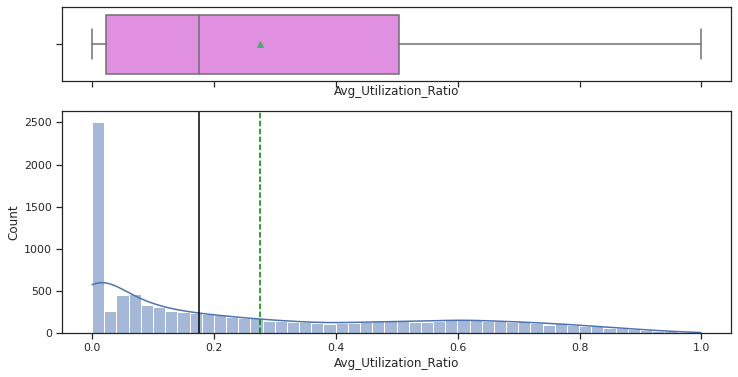

In [45]:
histogram_boxplot(data['Avg_Utilization_Ratio'])

In [46]:
# Top 10 Lowest Values for 'Avg_Utilization_Ratio'
data['Avg_Utilization_Ratio'].nsmallest(n = 5)

2     0.0
4     0.0
12    0.0
21    0.0
24    0.0
Name: Avg_Utilization_Ratio, dtype: float64

In [47]:
print("There are {} data entries with 'Avg_Utilization_Ratio' of $0, representing {}% of the total entries".format(len(data[(data['Avg_Utilization_Ratio'] == 0)]),\
                                                                                                                    round(100 * len(data[(data['Avg_Utilization_Ratio'] == 0)]) / len(data), 2)))

There are 2470 data entries with 'Avg_Utilization_Ratio' of $0, representing 24.39% of the total entries


In [48]:
# Checking Descriptive Statistics and Skewness for 'Total_Revolving_Bal'
print(data[['Avg_Utilization_Ratio']].describe())
print()
print('Skewness', data[['Avg_Utilization_Ratio']].skew())

       Avg_Utilization_Ratio
count           10127.000000
mean                0.274894
std                 0.275691
min                 0.000000
25%                 0.023000
50%                 0.176000
75%                 0.503000
max                 0.999000

Skewness Avg_Utilization_Ratio    0.718008
dtype: float64


- 'Avg_Utilization_Ratio' has a range from 0.0 to 1.0, a mean and median at 0.27 and 0.18, respectively. Also, its distribution is skewed to the right (skewness of 0.718).

- Also, there are 2470 data entries with 'Avg_Utilization_Ratio' of \\$0, representing 24.39\% of the total entries. This amount may be associated with the Customers who didn't use the credit card for any purchases in the last 12 months. Coincidently this is exactly the same amount of 'Total_Revolving_Bal' values of \\$0.

#### 1.3 - Univariate Analysis for Numeric/Discrete Variables with More Categories

##### Univariate Analysis for 'Customer_Age'

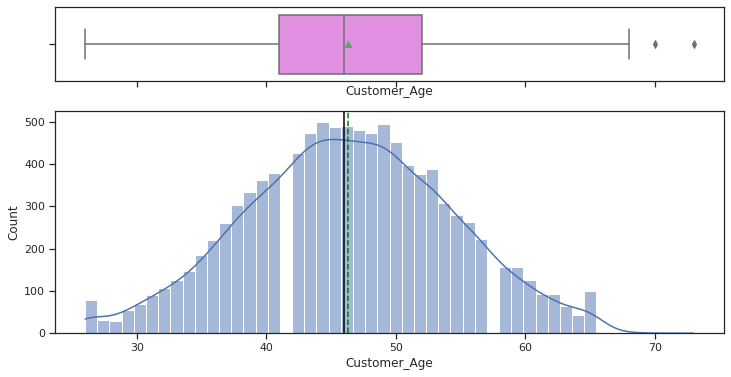

In [49]:
histogram_boxplot(data['Customer_Age'])

In [50]:
# Checking Descriptive Statistics and Skewness for 'Customer_Age'
print(data[['Customer_Age']].describe())
print()
print('Skewness', data[['Customer_Age']].skew())

       Customer_Age
count  10127.000000
mean      46.325960
std        8.016814
min       26.000000
25%       41.000000
50%       46.000000
75%       52.000000
max       73.000000

Skewness Customer_Age   -0.033605
dtype: float64


- 'Customer_Age' has a range from 26 to 73, a mean and median at 46.3 and 46, respectively. Also, its distribution looks very close to a normal distribution with neglibible skewness (skewness of -0.03).

##### Univariate Analysis for 'Months_on_book'

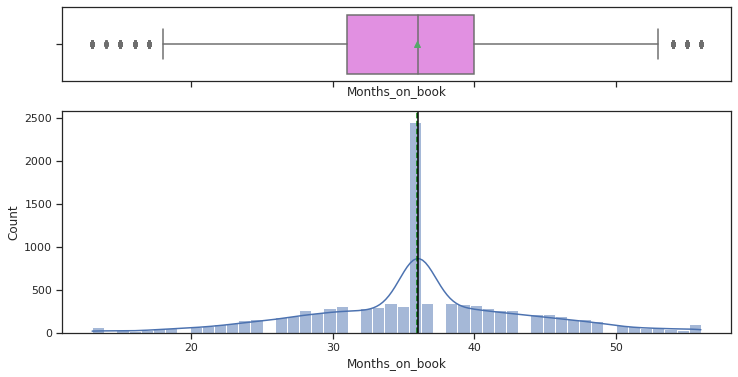

In [51]:
histogram_boxplot(data['Months_on_book'])

In [52]:
# Checking Descriptive Statistics and Skewness for 'Total_Revolving_Bal'
print(data[['Months_on_book']].describe())
print()
print('Skewness', data[['Months_on_book']].skew())
print()
print('Mode', data[['Months_on_book']].mode())

       Months_on_book
count    10127.000000
mean        35.928409
std          7.986416
min         13.000000
25%         31.000000
50%         36.000000
75%         40.000000
max         56.000000

Skewness Months_on_book   -0.106565
dtype: float64

Mode    Months_on_book
0              36


In [53]:
print("There are {} data entries with 'Months_on_book' of 36, representing {}% of the total entries".format(len(data[(data['Months_on_book'] == 36)]),\
                                                                                                                    round(100 * len(data[(data['Months_on_book'] == 36)]) / len(data), 2)))

There are 2463 data entries with 'Months_on_book' of 36, representing 24.32% of the total entries


- 'Months_on_book' has a range from 13 to 56, a mean and median at 35.9 and 36, respectively. Also, its distribution doesn't exhibit a relevant degree of skewness (skewness of -0.11).

- The mode for the 'Months_on_book' is 36. There are 2463 data entries with 'Months_on_book' of 36, representing 24.32% of the total entries.

#### 1.4 - Univariate/Bivariate Analysis for Numeric/Discrete Variables with Fewer Categories

##### Univariate/Bivariate Analysis for 'Dependent_count'

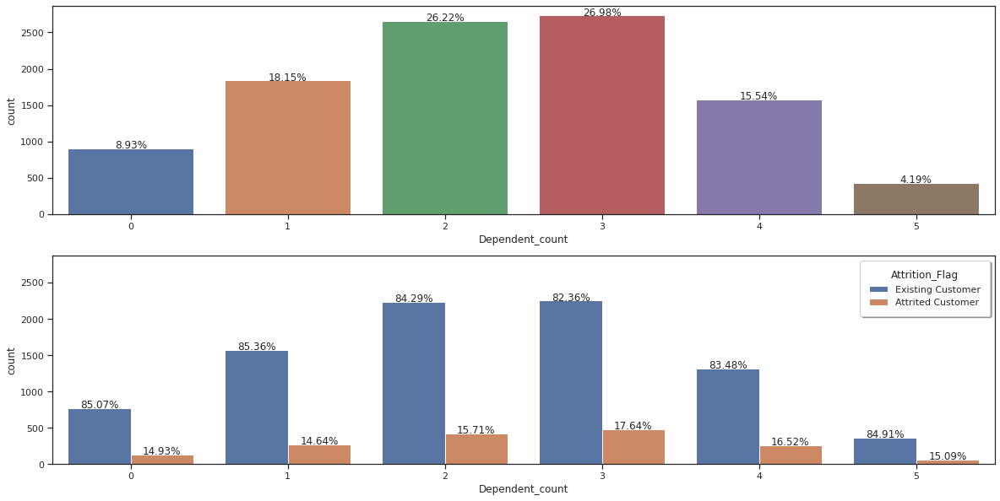

In [54]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Dependent_count", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- 'Dependent_count' of '2' and '3' present higher percentages in the dataset, with 26.22% and 26.98% respectively. Only 4.19% of the Customers have 5 dependents.

- All categories presented approximate similar percentages of attrited Customers (range from 14.93% to 17.64%).

##### Univariate/Bivariate Analysis for 'Total_Relationship_Count'

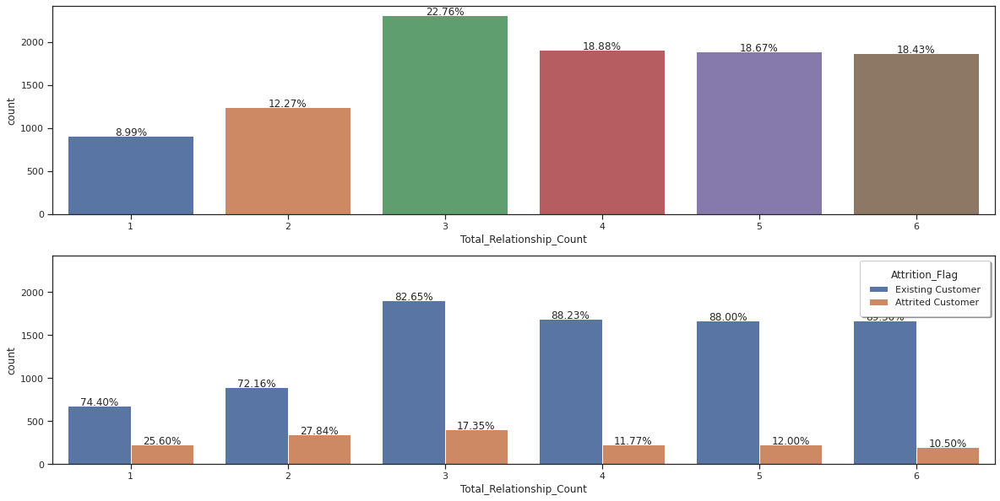

In [55]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Total_Relationship_Count", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- 'Total_Relationship_Count' of '3' is more frequent in the dataset, with 22.76% of contribution.

- Categories '1' and '2' with a higher percentage of Customer attrition (25.60% and 27.84%, respectively) when compared to the other categories.

##### Univariate/Bivariate Analysis for 'Months_Inactive_12_mon'

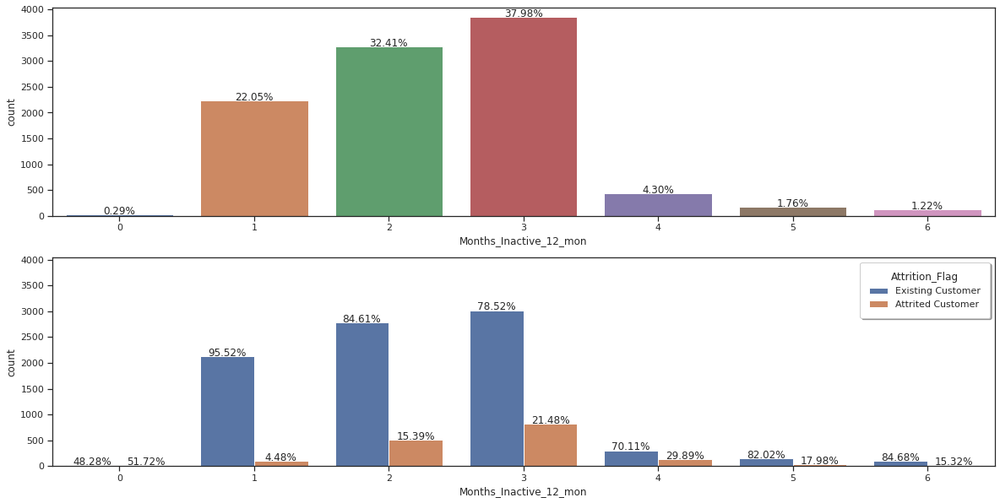

In [56]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Months_Inactive_12_mon", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- 'Months_Inactive_12_mon' categories '2' and '3' are more frequent in the dataset, with 32.41% and 37.98% of contribution, respectively. Category '0' has a negligible percentage in the dataset (0.29%). 

- Categories '3' and '4' with a higher percentage of Customer attrition (21.48% and 29.89%, respectively) when compared to the other categories.

##### Univariate/Bivariate Analysis for 'Contacts_Count_12_mon'

posx and posy should be finite values
posx and posy should be finite values


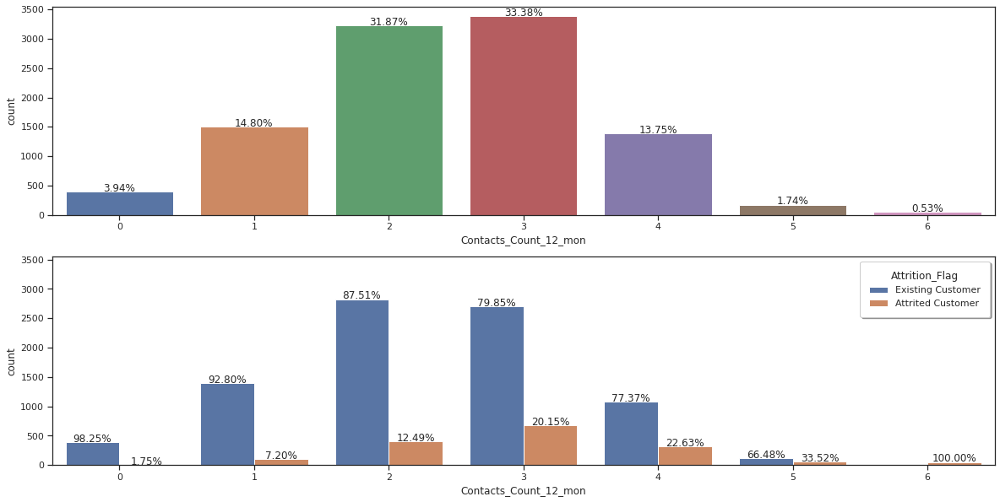

In [57]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Contacts_Count_12_mon", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- 'Months_Inactive_12_mon' categories '2' and '3' are more frequent in the dataset, with 31.87% and 33.38% of contribution, respectively. Category '6' has a negligible percentage in the dataset (0.53%). 

- Categories '3', '4', '5' with higher percentages of Customer attrition (20.15%, 22.63% and 33.52%, respectively) when compared to the other categories.

#### 1.5 - Bivariate Analysis for Numeric/Continuous and Numeric/Discrete Variables

In [58]:
# Replace Categories of 'Attrition_Flag' by 0 (Existing Customer) and 1 (Attrited Customer)
data['Attrition_Flag'].replace({'Existing Customer' : 0, 'Attrited Customer' : 1}, inplace = True)

In [59]:
# Numeric/Continuous and Numeric/Discrete Variables
num_vars = ['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',\
           'Customer_Age', 'Months_on_book',\
           'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon',\
           'Attrition_Flag']

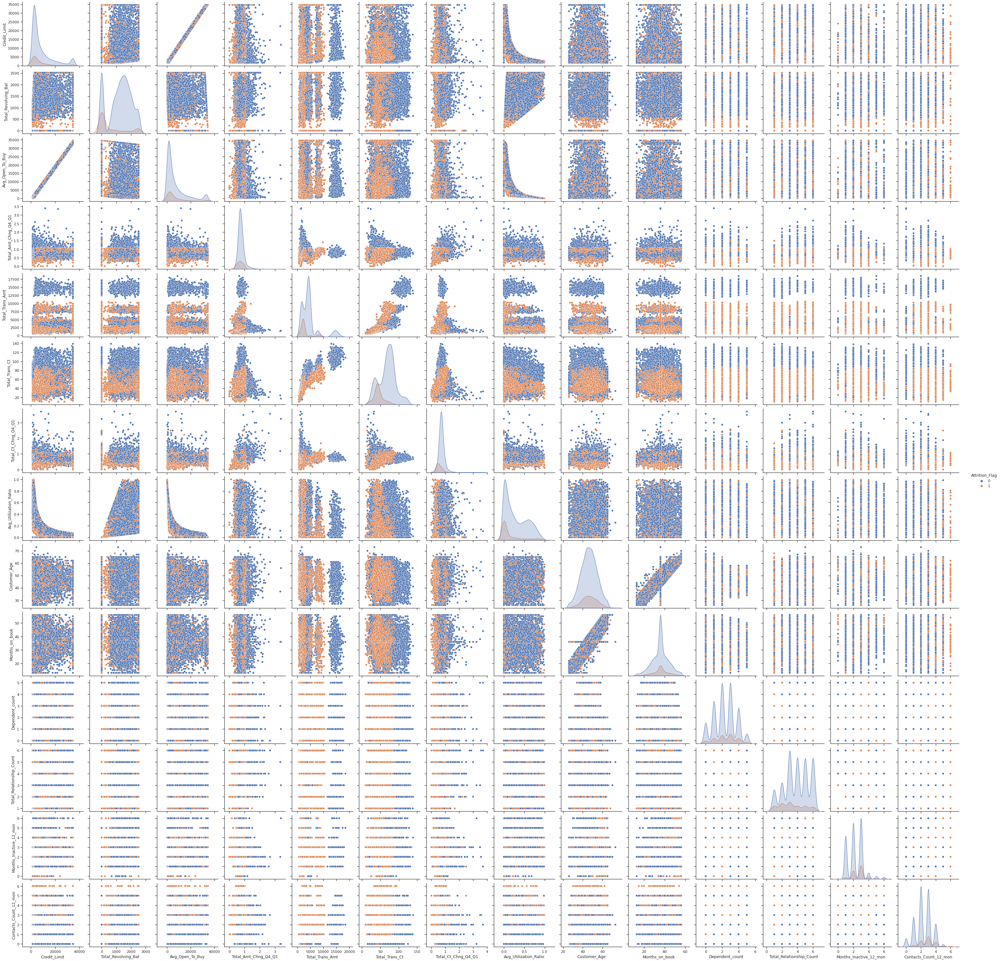

In [60]:
# Bivariate Analysis - Pairplot for Numeric/Continuous and Numerical/Discrete Variables
sns.set_style("white")
sns.set_style("ticks")
sns.set_context("notebook")
sns.pairplot(data = data[num_vars], hue = 'Attrition_Flag', height = 3, corner = False);

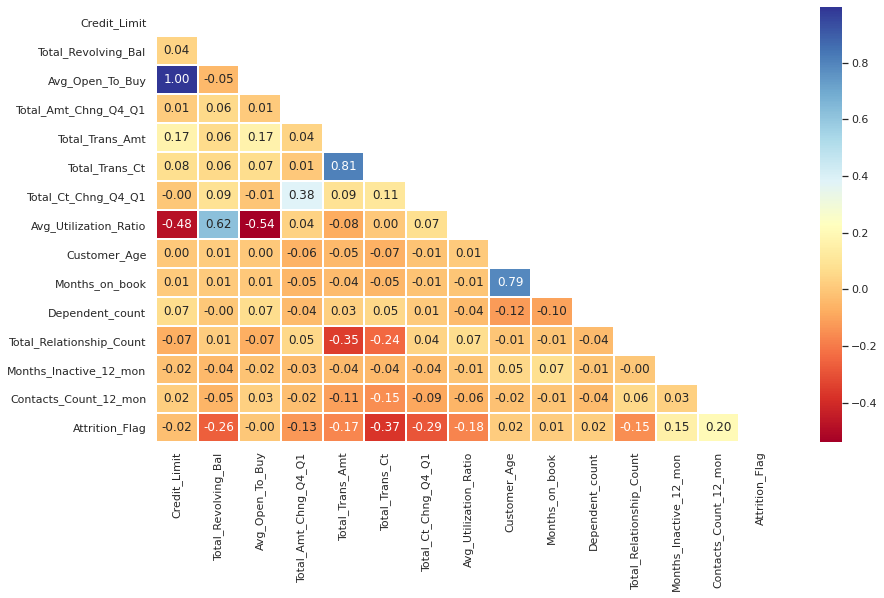

In [61]:
# Bivariate Analysis - Heatmap for Numeric/Continuous and Numerical/Discrete Variables
sns.set({'figure.figsize': (14,8)})
sns.set_style("whitegrid")
corr = data[num_vars].corr()
lower_triangle = np.tril(corr, k = -1)
sns.set_context("notebook")
mask = lower_triangle == 0
sns.heatmap(data[num_vars].corr(), annot = True, cmap = "RdYlBu", fmt = '.2f', linewidths = 0.05, mask = mask);

- 'Credit_Limit' and 'Avg_Open_To_Buy' are highly correlated (100%), meaning we don't need both variables belonging to the classification model. 'Avg_Open_To_Buy' will be eliminated from the dataset.

- As previously captured at the Univariate Analysis, the 'Total_Trans_Ct' is confirmed to be highly correlated with 'Total_Trans_Amt'(81%), meaning we don't need both variables belonging to the classification model. 'Total_Trans_Amt' will be eliminated from the dataset.
- 'Customer_Age' and 'Months_on_book' are also highly correlated (79%), and 'Months_on_book' will be eliminated from the dataset.
- 'Total_Revolving_Bal' and 'Avg_Utilization_Ratio' are also highly correlated (62%), and 'Avg_Utilization_Ratio' will be eliminated from the dataset. By removing 'Avg_Utilization_Ratio' that will also clean its negative correlations with 'Credit_Limit'(-48%) and 'Avg_Open_To_Buy' (-54%). 

In [62]:
# Dropping 'Avg_Open_To_Buy', 'Total_Trans_Amt', 'Months_on_book' and 'Avg_Utilization_Ratio' from the Dataset
data.drop(columns = ['Avg_Open_To_Buy', 'Total_Trans_Amt', 'Months_on_book', 'Avg_Utilization_Ratio'], inplace = True)

- 'Avg_Open_To_Buy', 'Total_Trans_Amt', 'Months_on_book' and 'Avg_Utilization_Ratio' were dropped from the dataset

In [63]:
# Numeric/Continuous and Numeric/Discrete Variables
num_vars = ['Credit_Limit', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',\
           'Customer_Age',\
           'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon',\
            'Attrition_Flag']

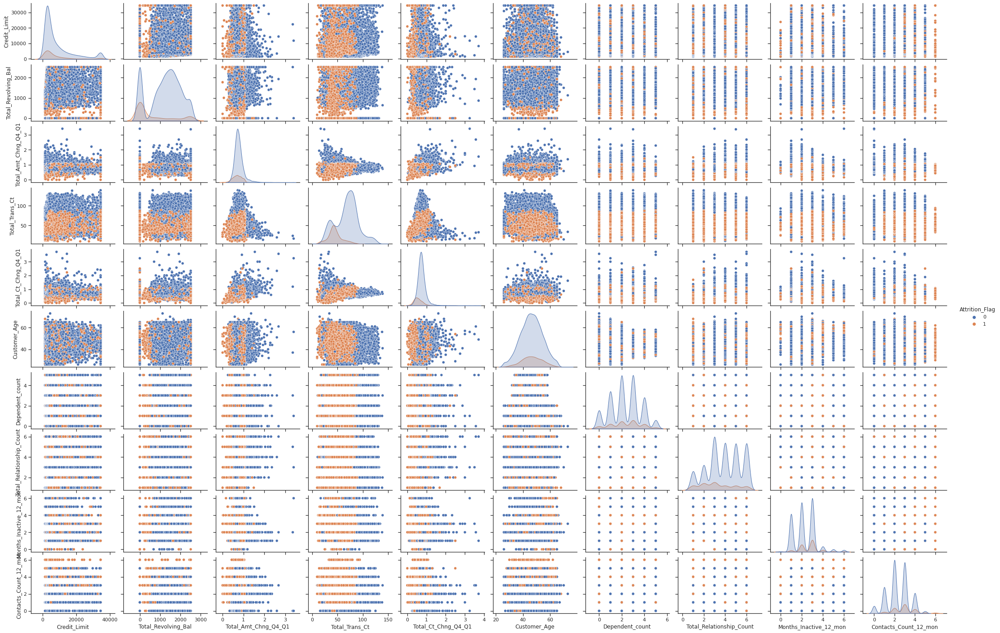

In [64]:
# Bivariate Analysis - Pairplot for Numeric/Continuous and Numerical/Discrete Variables
sns.set_style("white")
sns.set_style("ticks")
sns.set_context("notebook")
sns.pairplot(data = data[num_vars], hue = 'Attrition_Flag', height = 2, aspect = 1.5, corner = False);

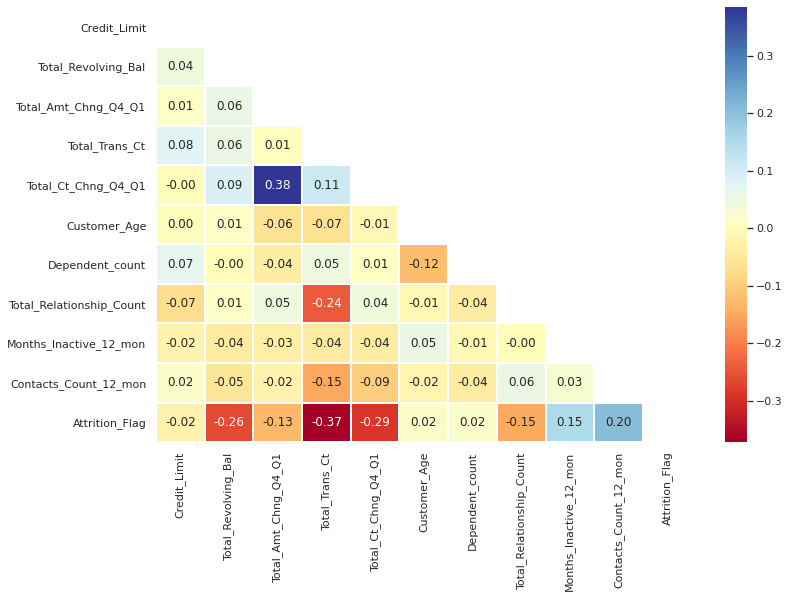

In [65]:
# Bivariate Analysis - Heatmap for Numeric/Continuous and Numerical/Discrete Variables
sns.set({'figure.figsize': (12,8)})
sns.set_style("whitegrid")
corr = data[num_vars].corr()
lower_triangle = np.tril(corr, k = -1)
sns.set_context("notebook")
mask = lower_triangle == 0
sns.heatmap(data[num_vars].corr(), annot = True, cmap = "RdYlBu", fmt = '.2f', linewidths = 0.05, mask = mask);

- 'Total_Revolving_Bal', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1' and 'Total_Relationship_Count' have some degree of association (negative correlation) with the target variable 'Attrition_Flag'. 

- 'Months_Inactive_12_mon' and 'Contacts_Count_12_mon' also have some degree of association (positive correlation) with the target variable 'Attrition_Flag'. 
- To explore these relatioships with the targte variable in more details, histograms and boxplots will be used in next steps.

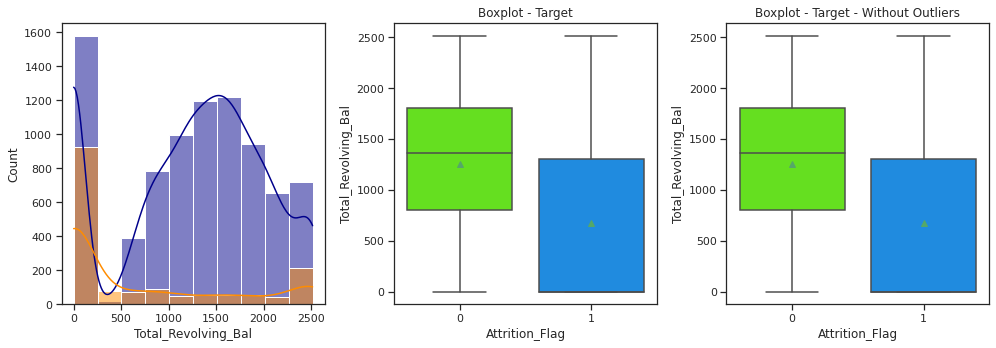

In [66]:
# Histogram and Boxplots with Hue on the Target Value for 'Total_Revolving_Bal'
combo_plot(feature = 'Total_Revolving_Bal', target = 'Attrition_Flag', nbins = 10)

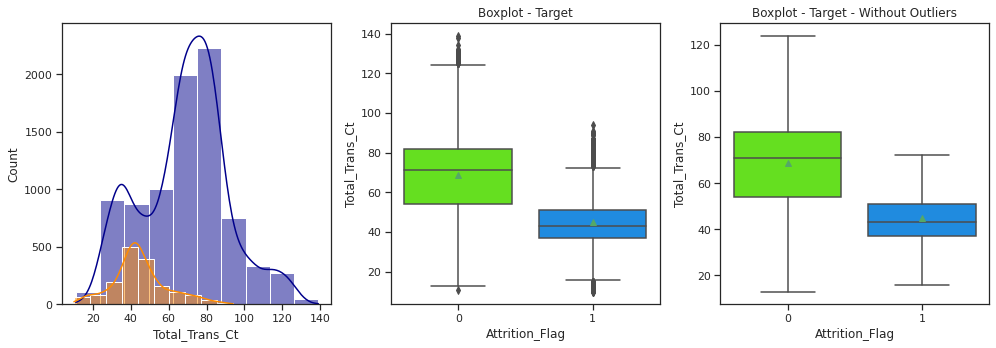

In [67]:
# Histogram and Boxplots with Hue on the Target Value for 'Total_Trans_Ct'
combo_plot(feature = 'Total_Trans_Ct', target = 'Attrition_Flag', nbins = 10)

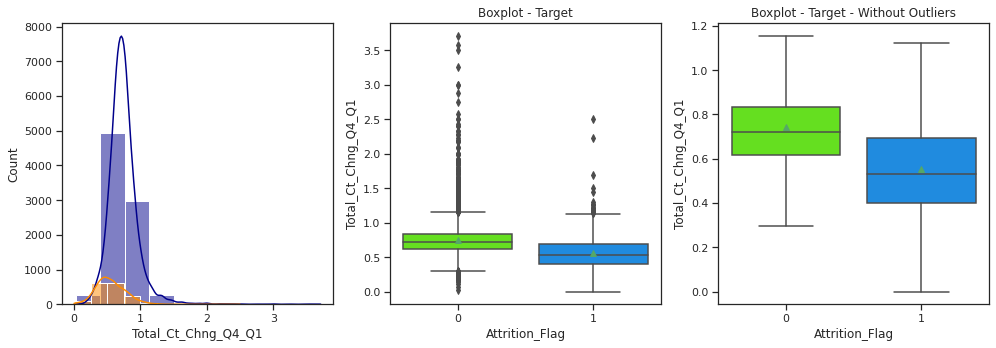

In [68]:
# Histogram and Boxplots with Hue on the Target Value for 'Total_Ct_Chng_Q4_Q1'
combo_plot(feature = 'Total_Ct_Chng_Q4_Q1', target = 'Attrition_Flag', nbins = 10)

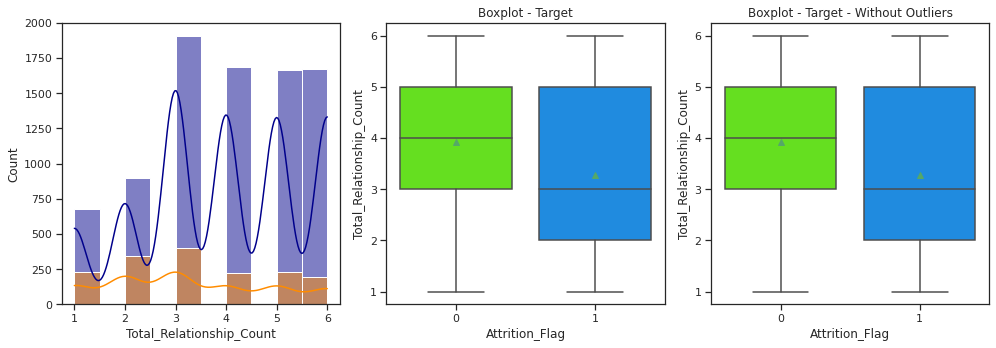

In [69]:
# Histogram and Boxplots with Hue on the Target Value for 'Total_Relationship_Count'
combo_plot(feature = 'Total_Relationship_Count', target = 'Attrition_Flag', nbins = 10)

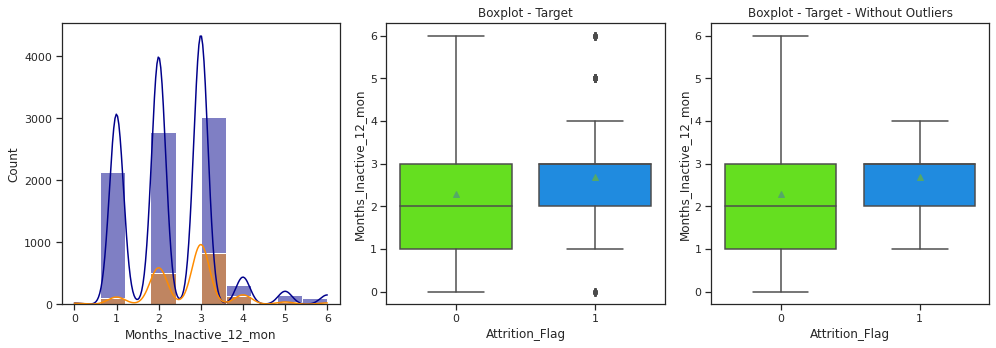

In [70]:
# Histogram and Boxplots with Hue on the Target Value for 'Months_Inactive_12_mon'
combo_plot(feature = 'Months_Inactive_12_mon', target = 'Attrition_Flag', nbins = 10)

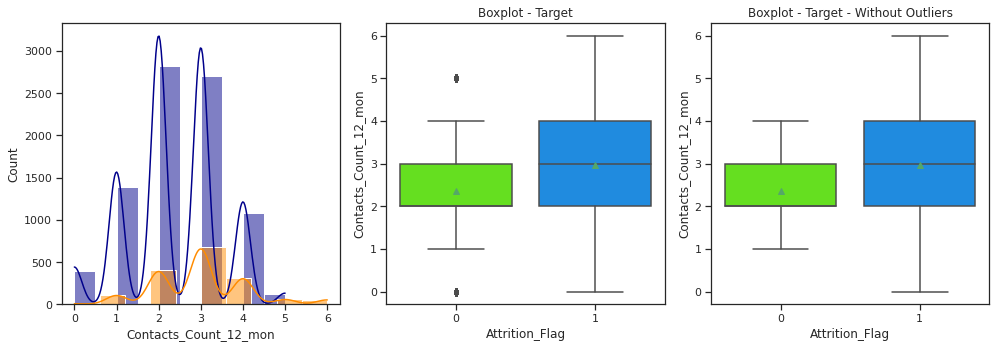

In [71]:
# Histogram and Boxplots with Hue on the Target Value for 'Contacts_Count_12_mon'
combo_plot(feature = 'Contacts_Count_12_mon', target = 'Attrition_Flag', nbins = 10)

- The correlations between 'Total_Revolving_Bal', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1' and 'Total_Relationship_Count' with the target variable are negative. That means, on average, there will be less attrited Customers by increasing the magnitude of these variables. This can also be visualized on the Histogram & Boxplots above, were the average related to the blue box (Attrition_Flag =1) is lower than the average related to the green box (Attrition_Flag = 0).

- The correlations between 'Months_Inactive_12_mon' and 'Contacts_Count_12_mon' with the target variable are positive. That means, on average, there will be more attrited Customers by increasing the magnitude of these variables. This can also be visualized on the Histogram & Boxplots above, were the average related to the blue box (Attrition_Flag =1) is higher than the average related to the green box (Attrition_Flag = 0).

#### 1.6 - Univariate/Bivariate Analysis for Categorical/Nominal Variables

##### Univariate Analysis for 'Attrition_Flag'

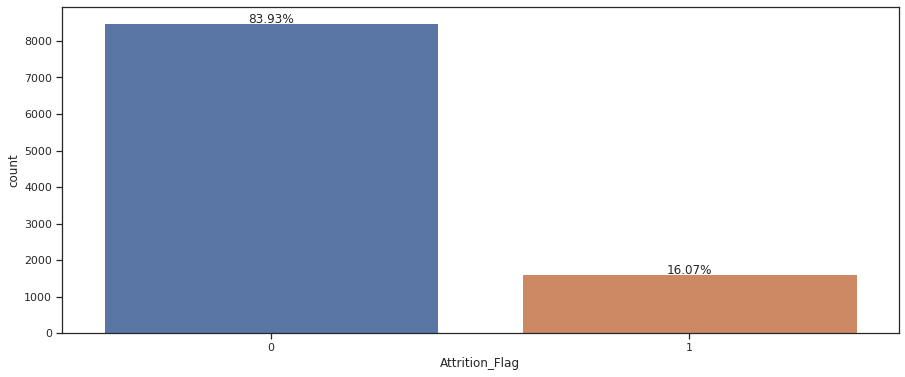

In [72]:
# Countplot with Overall Percentages
feature = data['Attrition_Flag']
sns.set({'figure.figsize': (15, 6)})
sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("notebook")
total = len(feature)
ax = sns.countplot(x = feature, data = data)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height + 5, '{:1.2f}'.format(100 * height / total) + "%", ha = "center")

- As mentioned before, 'Attrition_Flag' has a relevant class imbalance between the classes 0 ('Existing Customer') and 1 ('Attrited Customer'), with 83.9% and 16.1% of the data allocated to classes 0 and 1 respectively. Because of that, a technique to compensate the classes imbalance is recommended to be used before fitting the Classification models.

##### Univariate/Bivariate Analysis for 'Gender'

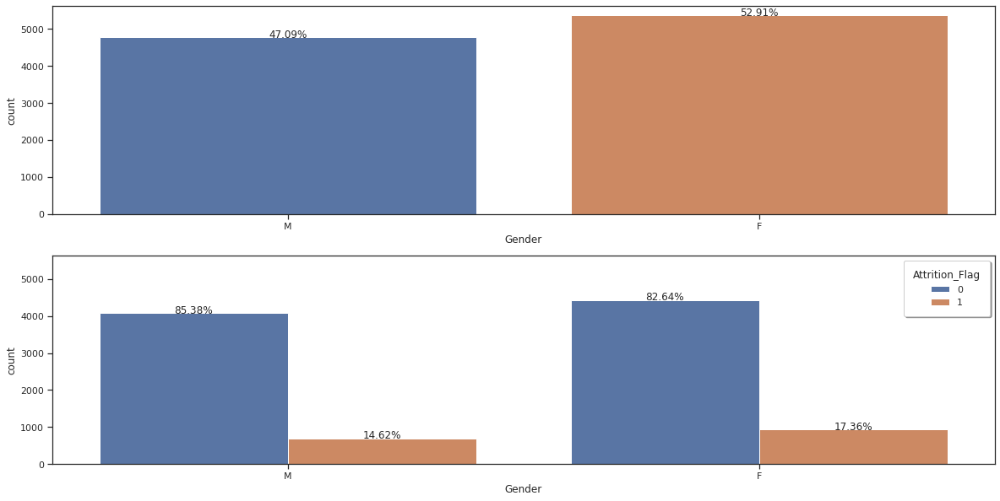

In [73]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Gender", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- There's a slightly higher percentage of 'Female' respondents in the dataset, representing 52.91% of the data entries.

- 'Female' were also associated with a slightly higher percentages of Customer attrition (17.36%), when compared to the the 'Male' category (14.62%).

##### Univariate/Bivariate Analysis for 'Education_Level'

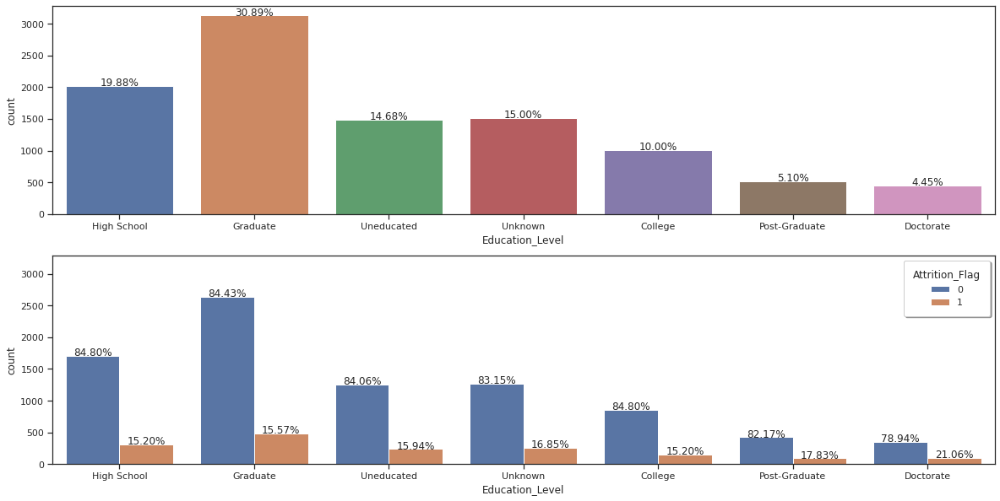

In [74]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Education_Level", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- 'High School' and 'Graduate' are more frequent in the dataset, with 19.88% and 30.89% of contribution, respectively.

- Categories 'Post-Graduate' and 'Doctorate' with a higher percentage of Customer attrition (17.83% and 21.06%, respectively) when compared to the other categories.

##### Univariate/Bivariate Analysis for 'Marital_Status'

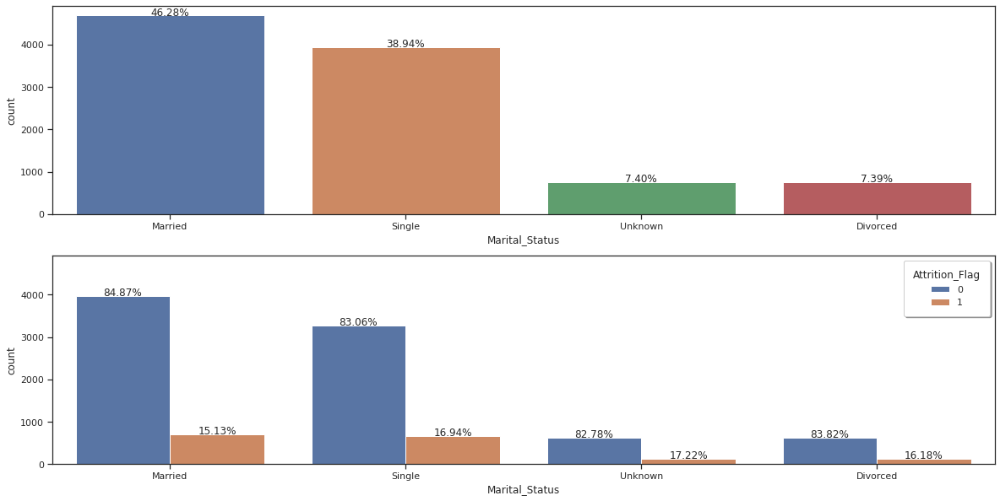

In [75]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Marital_Status", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- 'Maried' and 'Single' are more frequent in the dataset, with 46.28% and 38.94% of contribution, respectively.

- All categories presented approximate similar percentages of attrited Customers (range from 15.13% to 17.22%).

##### Univariate/Bivariate Analysis for 'Income_Category'

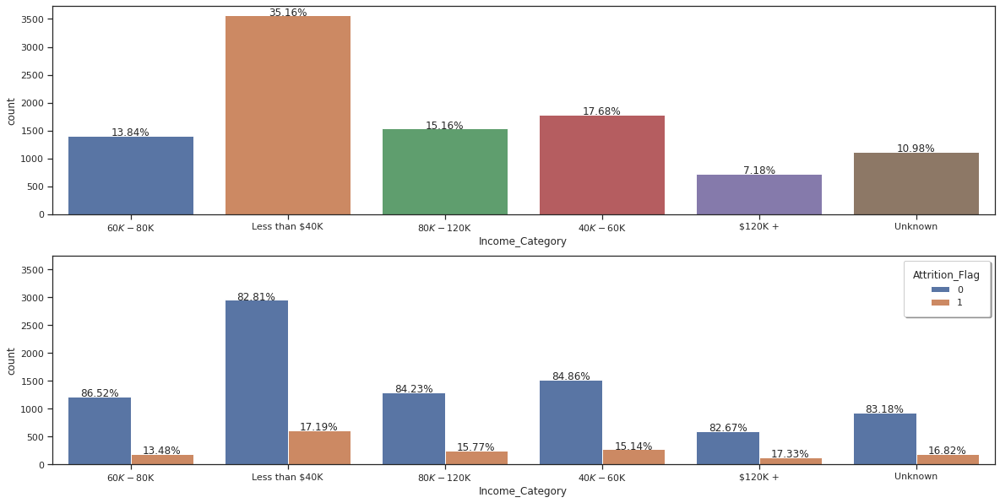

In [76]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Income_Category", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- Income 'Less than \\$40K' is more frequent in the dataset, with 35.16% of contribution.

- Categories 'Less than \\$40K' and '\\$120K +' with a slightly higher percentage of Customer attrition (17.19% and 17.33%, respectively) when compared to the other categories.

##### Univariate/Bivariate Analysis for 'Card_Category'

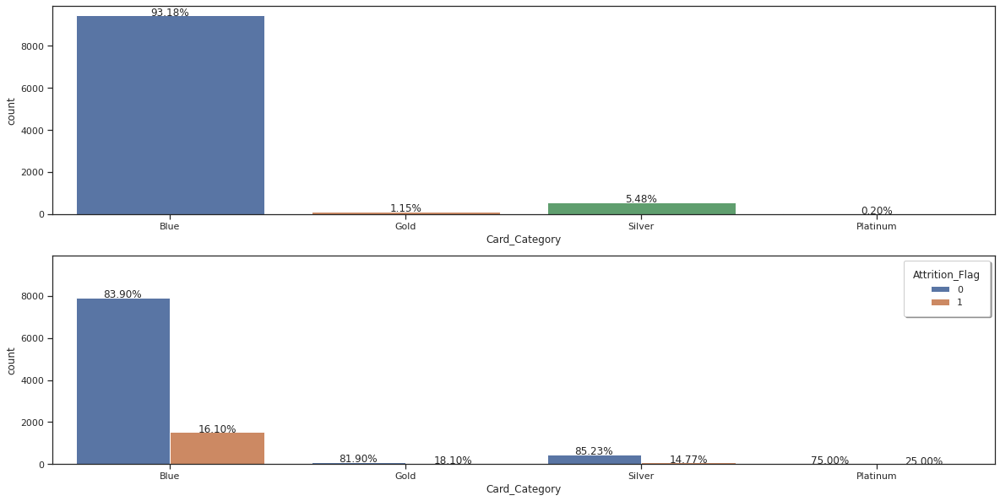

In [77]:
# Combo Countplot with overall Percentages (top graph) and Percentages Split on 'Attrition_Flag' within each Category (bottom graph)
percentage_on_bar(feature = "Card_Category", hue = "Attrition_Flag", data = data, order = None, hue_order = None)

- The 'Blue' category is much more frequent in the dataset, with 93.18% of contribution.

- Category 'Platinum' has a negligible percentage in the dataset (0.20%). The other categories presented approximate similar percentages of attrited Customers (range from 14.77% to 18.10%).

#### 1.7 - Chi-Square Test for Categorical/Nominal Variables

The Chi-Square test is a statistical method to determine if two categorical variables have a significant correlation between them.\
**Null Hypothesis -** There is no association between the two variables.\
**Alternate Hypothesis -** There is an association between two variables.

If a calculated P-value is low (less the established threshold of 0.05 or 5%) then we fail to reject the Null Hyphotesis, meaning the association between two variables is statistically significant.

In [78]:
# Defining the Categorical/Nominal Variables and Creating an Empty Matrix to Store the Chi-Square P-Values
cat_vars = ["Gender", "Education_Level", "Marital_Status", "Income_Category", "Card_Category", "Attrition_Flag"]
chisqmatrix = pd.DataFrame(np.nan, columns = cat_vars, index = cat_vars)

In [79]:
# Populating the Chi-Square Matrix with the Associated P-Values among all the Categorical/Nominal Variables
outercnt = 0
innercnt = 0
for icol in cat_vars:
    for jcol in cat_vars:
        mycrosstab = pd.crosstab(data[icol], data[jcol])
        chi, p, dof, expected = stats.chi2_contingency(mycrosstab)
        if icol == jcol:
            p = np.nan
        chisqmatrix.iloc[outercnt, innercnt] = round(p, 5)
        innercnt = innercnt + 1
    innercnt = 0
    outercnt = outercnt + 1
chisqmatrix

,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
Gender,NaN,0.29498,0.27524,0.00000,0.00000,0.00020
Education_Level,0.29498,NaN,0.25451,0.03655,0.48034,0.05149
Marital_Status,0.27524,0.25451,NaN,0.31078,0.00018,0.10891
Income_Category,0.00000,0.03655,0.31078,NaN,0.00000,0.02500
Card_Category,0.00000,0.48034,0.00018,0.00000,NaN,0.52524
Attrition_Flag,0.00020,0.05149,0.10891,0.02500,0.52524,NaN


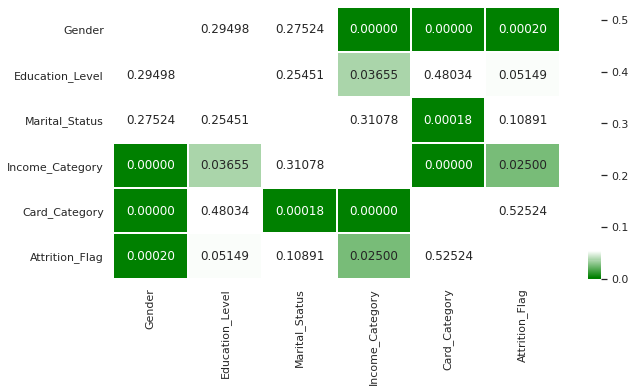

In [80]:
# Heatmap for the Chi-Square Matrix P-Values
from matplotlib.colors import LinearSegmentedColormap
nodes = [0, 0.1, 1.0]
colors = ["green", "white", "white"]
cmap = LinearSegmentedColormap.from_list("", list(zip(nodes, colors)))
sns.set({'figure.figsize': (10,5)})
sns.set_style("whitegrid")
sns.set_context("notebook")
sns.heatmap(chisqmatrix, annot = True, cmap = cmap, fmt = '.5f', linewidths = 0.05);

- There is a relevant correlation (P-value = 0.025) between 'Income_Category' and 'Attrition_Flag'.

- There is a relevant correlation (P-value = 0.0002) between 'Gender' and 'Attrition_Flag'.
- Both 'Education_Level', 'Marital_Status' and 'Income_Category' have an 'Unknown' category. Because there's at least one variable correlated (P-value < 0.05) with each of them, a KNN imputation will be used to replace the 'Unknown' values.
- More details about the correlations among the other Categorical/Nominal independent variables ('Gender', 'Income_Category', 'Card_Category', 'Education_Level' and 'Marital_Status') will be reviewed next.

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


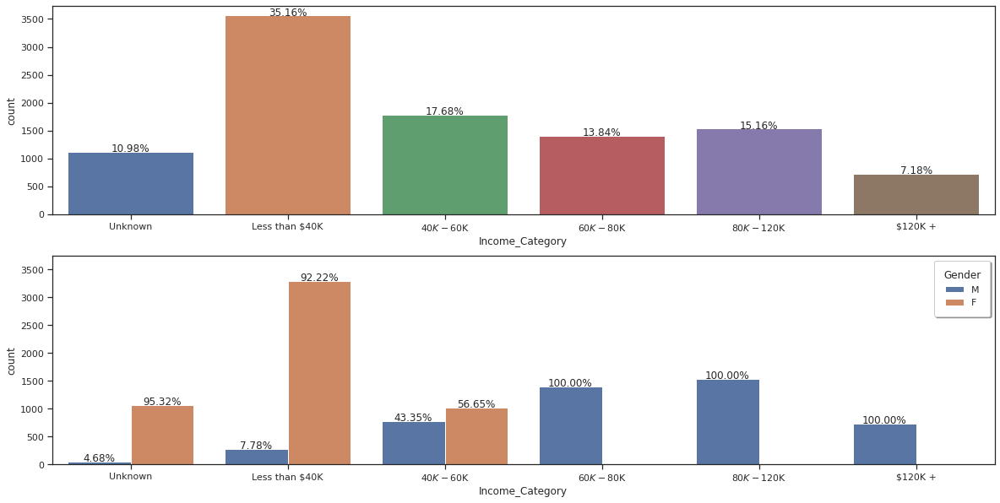

In [81]:
# Combo Countplot with overall Percentages for 'Income_Category' (top graph) and Percentages Split on 'Gender' within each Category (bottom graph)
percentage_on_bar(feature = "Income_Category", hue = "Gender", data = data, order = ["Unknown", "Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"], hue_order = None)

- 'Income_Category' vs. 'Gender' - Chi-square P-value ~ 0, meaning there's a statistically significant correlation between the 02 variables. The 'Less than \\$40K' and ' \\$40K - \\$60K' categories from 'Income_Category' contribute the most to the Chi-square statistic and produce the statistical significance.

- Female Customers make less money than Male Customers. Female Customers 'Income_Category' is either 'Less than \\$40K' or '\\$40K - \\$60K'. Only Male Customers are fall into the '\\$60K - \\$80K' or '\\$80K - \\$120K' or '\\$120K +' categories.

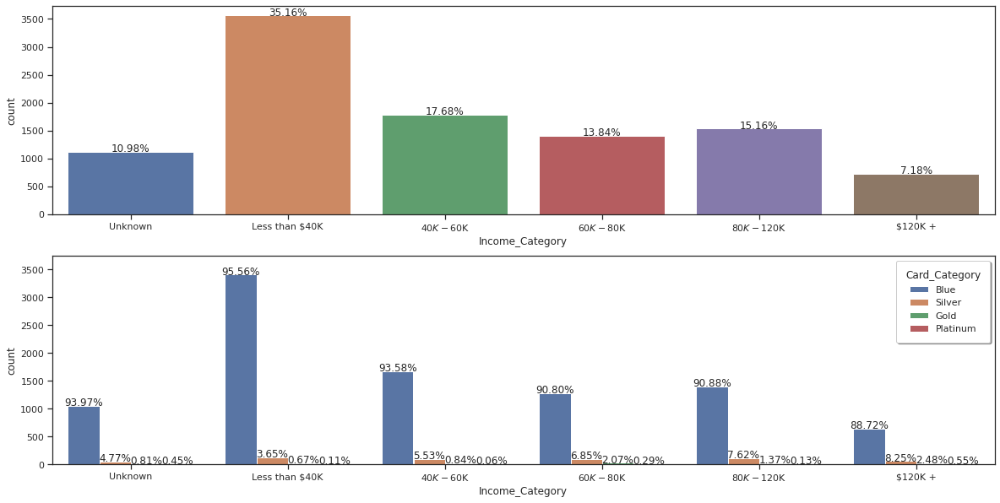

In [82]:
# Combo Countplot with overall Percentages for 'Income_Category' (top graph) and Percentages Split on 'Card_Category' within each Category (bottom graph)
percentage_on_bar(feature = "Income_Category", hue = "Card_Category", data = data,
                  order = ["Unknown", "Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"], hue_order = ["Blue", "Silver", "Gold", "Platinum"])

- 'Income_Category' vs. 'Card_Category' - Chi-square P-value ~ 0, meaning there's a statistically significant correlation between the 02 variables. The 'Less than \\$40K' and ' \\$40K - \\$60K' categories from 'Income_Category' contribute the most to the Chi-square statistic and produce the statistical significance.

- The 'Blue' category for 'Card_Category' is more frequent for Customers who make less than \\$60K per year ('Less than \\$40K' and ' \\$40K - \\$60K' categories).

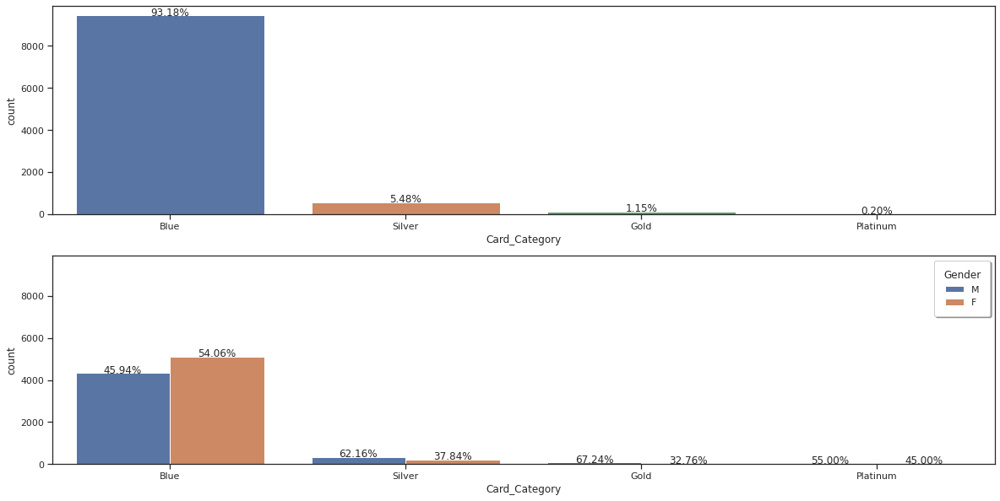

In [83]:
# Combo Countplot with overall Percentages for 'Card_Category' (top graph) and Percentages Split on 'Gender' within each Category (bottom graph)
percentage_on_bar(feature = "Card_Category", hue = "Gender", data = data, order = ["Blue", "Silver", "Gold", "Platinum"], hue_order = None)

- 'Card_Category' vs. 'Gender' - Chi-square P-value ~ 0, meaning there's a statistically significant correlation between the 02 variables. The 'Blue' category from 'Card_Category' contributes the most to the Chi-square statistic and produce the statistical significance.

- The 'Blue' category for 'Card_Category' is more frequent for Female Customers. The other categories are more frequent for Male Customers.

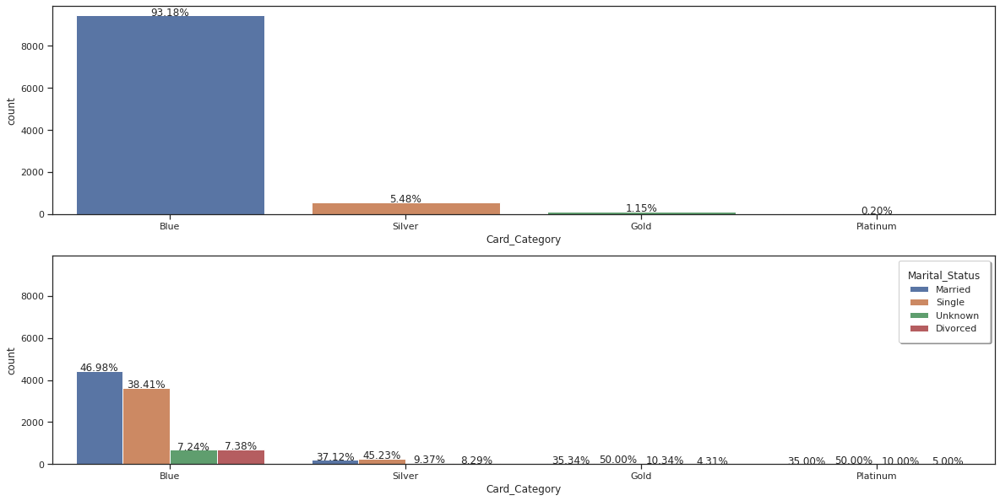

In [84]:
# Combo Countplot with overall Percentages for 'Card_Category' (top graph) and Percentages Split on 'Marital_Status' within each Category (bottom graph)
percentage_on_bar(feature = "Card_Category", hue = "Marital_Status", data = data, order = ["Blue", "Silver", "Gold", "Platinum"], hue_order = None)

- 'Card_Category' vs. 'Marital_Status' - Chi-square P-value ~ 0, meaning there's a statistically significant correlation between the 02 variables. The 'Blue' category from 'Card_Category' contributes the most to the Chi-square statistic and produce the statistical significance.

- The 'Blue' category for 'Card_Category' is more frequent for Married Customers. The other categories are more frequent for Single Customers.

***
## 2 - Illustrate the Insights based on EDA <a class="anchor" id="22"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
- Key meaningful observations on the relationship between variables

Summary for the key insights from EDA (all graphs and other details were covered at the previous sessions): 

- 'Attrition_Flag' is the Dependent Variable for the classification model, having 02 distinct categories: 'Existing Customer' and 'Attrited Customer'. This is a relevant imbalance on the 'Attrition Flag' categories, with 83.9% of data associated with 'Existing Customer' and 16.1% of the data associated with the 'Attrited Customer'. Because of that, a technique to compensate the classes imbalance is recommended to be used before fitting the Classification models.

- 'Dependent_count' of '2' and '3' present higher percentages in the dataset, with 26.22% and 26.98% respectively. Only 4.19% of the Customers have 5 dependents. All categories presented approximate similar percentages of attrited Customers (range from 14.93% to 17.64%).

- 'Total_Relationship_Count' of '3' is more frequent in the dataset, with 22.76% of contribution. Categories '1' and '2' with a higher percentage of Customer attrition (25.60% and 27.84%, respectively) when compared to the other categories.

- 'Months_Inactive_12_mon' categories '2' and '3' are more frequent in the dataset, with 32.41% and 37.98% of contribution, respectively. Category '0' has a negligible percentage in the dataset (0.29%). Categories '3' and '4' with a higher percentage of Customer attrition (21.48% and 29.89%, respectively) when compared to the other categories.

- Because of higher correlation with other variables in the dataset, 'Avg_Open_To_Buy', 'Total_Trans_Amt',  'Months_on_book' and 'Avg_Utilization_Ratio' were eliminated from the dataset.

- 'Total_Revolving_Bal', 'Total_Trans_Ct' and 'Total_Ct_Chng_Q4_Q1' have some degree of correlation with the target variable 'Attrition_Flag'. Their correlation with the target variable is negative. That means, on average, there will be more attrited Customers by decressing the magnitude of these variables.

- There's a slightly higher percentage of 'Female' respondents in the dataset, representing 52.91% of the data entries. 'Female' were also associated with a slightly higher percentages of Customer attrition (17.36%), when compared to the the 'Male' category (14.62%).

- 'High School' and 'Graduate' are more frequent in the dataset, with 19.88% and 30.89% of contribution, respectively. Categories 'Post-Graduate' and 'Doctorate' with a higher percentage of Customer attrition (17.83% and 21.06%, respectively) when compared to the other categories.

- 'Maried' and 'Single' are more frequent in the dataset, with 46.28% and 38.94% of contribution, respectively. All categories presented approximate similar percentages of attrited Customers (range from 15.13% to 17.22%).

- 'Less than \\$40K' is more frequent in the dataset, with 35.16% of contribution. Categories 'Less than \\$40K' and '\\$120K +' with a slightly higher percentage of Customer attrition (17.19% and 17.33%, respectively) when compared to the other categories.

- The 'Blue' category is much more frequent in the dataset, with 93.18\% of contribution. Category 'Platinum' has a negligible percentage in the dataset (0.20\%). The other categories presented approximate similar percentages of attrited Customers (range from 14.77\% to 18.10\%).

- There is a relevant correlation (P-value = 0.025) between 'Income_Category' and 'Attrition_Flag'. Also, there is a relevant correlation (P-value = 0.0002) between 'Gender' and 'Attrition_Flag'.

- 'Income_Category' vs. 'Gender' - Chi-square P-value ~ 0. Female Customers make less money than Male Customers. Female Customers 'Income_Category' is either 'Less than \\$40K' or '\\$40K - \\$60K'. Only Male Customers are fall into the '\\$60K - \\$80K' or '\\$80K - \\$120K' or '\\$120K +' categories.

- 'Income_Category' vs. 'Card_Category' - Chi-square P-value ~ 0. The 'Blue' category for 'Card_Category' is more frequent for Customers who make less than \\$60K per year.

- 'Card_Category' vs. 'Gender' - Chi-square P-value ~ 0. The 'Blue' category for 'Card_Category' is more frequent for Female Customers. The other categories are more frequent for Male Customers.

- 'Card_Category' vs. 'Marital_Status' - Chi-square P-value ~ 0. The 'Blue' category for 'Card_Category' is more frequent for Married Customers. The other categories are more frequent for Single Customers.

- Both 'Education_Level', 'Marital_Status' and 'Income_Category' have an 'Unknown' category. Because there's at least one variable correlated (P-value < 0.05) with each of them, a KNN imputation will be used to replace the 'Unknown' values.

***
## 3. Data Pre-processing <a class="anchor" id="33"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
    
- Prepare the data for analysis
- Missing value Treatment, Outlier Detection (treat, if needed- why or why not ), Feature Engineering, Prepare data for modeling

#### 3.1 - Prepare Data for Splitting

In [85]:
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,0,45,M,3,High School,Married,$60K - $80K,Blue,5,1,3,12691.0,777,1.335,42,1.625
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,6,1,2,8256.0,864,1.541,33,3.714
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,4,1,0,3418.0,0,2.594,20,2.333
3,0,40,F,4,High School,Unknown,Less than $40K,Blue,3,4,1,3313.0,2517,1.405,20,2.333
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,5,1,0,4716.0,0,2.175,28,2.500


In [86]:
# Replacing 'Unknown' Entries by 'NaN' before Splitting - this is a preparation step required to enable the KNN Imputation
data = data.replace('Unknown', np.nan)

In [87]:
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,0,45,M,3,High School,Married,$60K - $80K,Blue,5,1,3,12691.0,777,1.335,42,1.625
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,6,1,2,8256.0,864,1.541,33,3.714
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,4,1,0,3418.0,0,2.594,20,2.333
3,0,40,F,4,High School,NaN,Less than $40K,Blue,3,4,1,3313.0,2517,1.405,20,2.333
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,5,1,0,4716.0,0,2.175,28,2.500


In [88]:
# Manual Label Encoder - Enables Reverse Encoding after the KNN Inputation
gender = {'F':1, 'M':2}
data['Gender'] = data['Gender'].map(gender)

education = {'Uneducated':1, 'High School':2, 'College':3, 'Graduate':4, 'Post-Graduate':5, 'Doctorate':6}
data['Education_Level'] = data['Education_Level'].map(education)

marital = {'Single':1, 'Married':2, 'Divorced':3}
data['Marital_Status'] = data['Marital_Status'].map(marital)

income = {'Less than $40K':1, '$40K - $60K':2, '$60K - $80K':3, '$80K - $120K':4, '$120K +':5}
data['Income_Category'] = data['Income_Category'].map(income)

card = {'Blue':1, 'Silver':2, 'Gold':3, 'Platinum':47}
data['Card_Category'] = data['Card_Category'].map(card)

In [89]:
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,0,45,2,3,2.0,2.0,3.0,1,5,1,3,12691.0,777,1.335,42,1.625
1,0,49,1,5,4.0,1.0,1.0,1,6,1,2,8256.0,864,1.541,33,3.714
2,0,51,2,3,4.0,2.0,4.0,1,4,1,0,3418.0,0,2.594,20,2.333
3,0,40,1,4,2.0,NaN,1.0,1,3,4,1,3313.0,2517,1.405,20,2.333
4,0,40,2,3,1.0,2.0,3.0,1,5,1,0,4716.0,0,2.175,28,2.500


#### 3.2 - Splitting the Data into Train and Test Sets

In [90]:
# Standard Seed Definition - Same Seed be Used for all Data Pre-processing and Model Building Processes 
seed = 1

In [91]:
# Separating target variable and other variables
X = data.drop(columns = "Attrition_Flag")
y = data["Attrition_Flag"]

In [92]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = seed, stratify = y)
print(X_train.shape, X_test.shape)

(7088, 15) (3039, 15)


In [93]:
# Resulting Split into Training and Test Set (70:30 Ratio)
print("Original True Values   : {0} ({1:0.2f}%)".format(len(data.loc[data['Attrition_Flag'] == 1]), (len(data.loc[data['Attrition_Flag'] == 1])/len(data.index)) * 100))
print("Original False Values  : {0} ({1:0.2f}%)".format(len(data.loc[data['Attrition_Flag'] == 0]), (len(data.loc[data['Attrition_Flag'] == 0])/len(data.index)) * 100))
print("")
print("Training True Values   : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training False Values  : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("Test True Values       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test False Values      : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))

Original True Values   : 1627 (16.07%)
Original False Values  : 8500 (83.93%)

Training True Values   : 1139 (16.07%)
Training False Values  : 5949 (83.93%)
Test True Values       : 488 (16.06%)
Test False Values      : 2551 (83.94%)


- Train and Test splits were created with 70% and 30% of the data, respectively.
- For the data splitting, a 'stratify = y' argument was utilized to create the splits with similar balance as per the target variable (as seen on the summary above).

#### 3.3 - Missing Values Treatment with KNN Imputer

In [94]:
# Checking Missing Values (previously assigned as 'Unknown') in both Train and Test Sets
print(X_train.isna().sum())
print('-'*30)
print(X_test.isna().sum())

Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1070
Marital_Status               514
Income_Category              784
Card_Category                  0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
dtype: int64
------------------------------
Customer_Age                  0
Gender                        0
Dependent_count               0
Education_Level             449
Marital_Status              235
Income_Category             328
Card_Category                 0
Total_Relationship_Count      0
Months_Inactive_12_mon        0
Contacts_Count_12_mon         0
Credit_Limit                  0
Total_Revolving_Bal           0
Total_Amt_Chng_Q4_Q1          0
Total_Trans_Ct                0
Total_Ct_Chng

In [95]:
# Instantiating KNN Imputer
# With the 'KNNImputer', each missing value will be imputed by looking at the 05 nearest neighbors (n_neighbors = 5) found in the training set
imputer = KNNImputer(n_neighbors = 5)

In [96]:
# Fit and Transform the Train and Test Datasets
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns = X_train.columns)
X_test = pd.DataFrame(imputer.transform(X_test), columns = X_test.columns)

In [97]:
# Checking that no Feature has any Missing Values on both Train and Test Sets
print(X_train.isna().sum())
print('-'*30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
dtype: int64


- All missing values have been treated.

In [98]:
# Function to Inverse the Encoding
def inverse_mapping(x, y):
    inv_dict = {v : k for k, v in x.items()}
    X_train[y] = np.round(X_train[y]).map(inv_dict).astype('category')
    X_test[y] = np.round(X_test[y]).map(inv_dict).astype('category')

In [99]:
# Inversing the Encoding on the Categorical/Nominal Variables
inverse_mapping(gender,'Gender')
inverse_mapping(education,'Education_Level')
inverse_mapping(marital,'Marital_Status')
inverse_mapping(income,'Income_Category')
inverse_mapping(card,'Card_Category')

In [100]:
# Checking Inverse Mapped Values/Categories on the Train Set
cols = X_train.select_dtypes(include=['object','category'])
for i in cols.columns:
    print(X_train[i].value_counts())
    print('*'*30)

F    3770
M    3318
Name: Gender, dtype: int64
******************************
Graduate         2439
High School      1638
College          1292
Uneducated       1035
Post-Graduate     372
Doctorate         312
Name: Education_Level, dtype: int64
******************************
Married     3651
Single      2932
Divorced     505
Name: Marital_Status, dtype: int64
******************************
Less than $40K    2627
$40K - $60K       1550
$80K - $120K      1195
$60K - $80K       1194
$120K +            522
Name: Income_Category, dtype: int64
******************************
Blue        6621
Silver       375
Gold          78
Platinum      14
Name: Card_Category, dtype: int64
******************************


In [101]:
# Checking Inverse Mapped Values/Categories on the Test Set
cols = X_test.select_dtypes(include=['object','category'])
for i in cols.columns:
    print(X_train[i].value_counts())
    print('*'*30)

F    3770
M    3318
Name: Gender, dtype: int64
******************************
Graduate         2439
High School      1638
College          1292
Uneducated       1035
Post-Graduate     372
Doctorate         312
Name: Education_Level, dtype: int64
******************************
Married     3651
Single      2932
Divorced     505
Name: Marital_Status, dtype: int64
******************************
Less than $40K    2627
$40K - $60K       1550
$80K - $120K      1195
$60K - $80K       1194
$120K +            522
Name: Income_Category, dtype: int64
******************************
Blue        6621
Silver       375
Gold          78
Platinum      14
Name: Card_Category, dtype: int64
******************************


- Inverse mapping returned original labels.

### 3.4 - Encoding Categorical/Nominal Variables

In [102]:
X_train.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,50.0,F,1.0,Graduate,Married,$40K - $60K,Blue,6.0,1.0,2.0,7985.0,0.0,1.032,72.0,0.674
1,50.0,M,0.0,College,Divorced,$60K - $80K,Blue,3.0,3.0,2.0,5444.0,2499.0,0.468,80.0,0.667
2,26.0,F,0.0,Graduate,Single,$40K - $60K,Blue,6.0,3.0,4.0,1643.0,1101.0,0.713,50.0,0.471
3,65.0,F,0.0,College,Single,Less than $40K,Blue,3.0,3.0,0.0,2022.0,0.0,0.579,65.0,0.548
4,46.0,M,3.0,Graduate,Single,$80K - $120K,Blue,6.0,3.0,4.0,4930.0,0.0,1.019,77.0,0.638


In [103]:
# Create a Copy for the X_train and the X_test to Utilize with Bagging and Boosting Models Upfront (Create Dummy Variable without Dropping First)
X_train_copy = X_train.copy()
X_test_copy = X_test.copy()

In [104]:
# Convert Categorical/Nominal Variables into Dummy Variables
X_train = pd.get_dummies(X_train, drop_first = True)
X_test = pd.get_dummies(X_test, drop_first = True)

print(X_train.shape, X_test.shape)

(7088, 25) (3039, 25)


In [105]:
X_train.head()

,Customer_Age,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,...,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,50.0,1.0,6.0,1.0,2.0,7985.0,0.0,1.032,72.0,0.674,...,0,1,0,1,0,0,0,0,0,0
1,50.0,0.0,3.0,3.0,2.0,5444.0,2499.0,0.468,80.0,0.667,...,0,0,0,0,1,0,0,0,0,0
2,26.0,0.0,6.0,3.0,4.0,1643.0,1101.0,0.713,50.0,0.471,...,0,0,1,1,0,0,0,0,0,0
3,65.0,0.0,3.0,3.0,0.0,2022.0,0.0,0.579,65.0,0.548,...,0,0,1,0,0,0,1,0,0,0
4,46.0,3.0,6.0,3.0,4.0,4930.0,0.0,1.019,77.0,0.638,...,0,0,1,0,0,1,0,0,0,0


- Dummy variables were created for all the Categorical/Nominal variables. The first hot-encoded column was dropped to prevent multi-colinearity on the Logistic Regression models

- Data is now ready for bulding the classification models (Logistic Regression).

### 3.5 - Classification Models Evaluation Criteria

- Based on the Background and Context:
    
    "Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of Customers’ and identify the Customers who will leave their credit card services and reason for same – so that bank could improve upon those areas."

- Because the bank is mostly interested in identifying the Customers who will leave their credit card services and reason for same, Recall is selected to be the most important metric. With that, there'll be more emphasis on increasing the amount of true positives and reducing the amount of false negatives. That'd reduce the chance to misclassify attrited Customers (who are willing to quit their credit card services) as existing Customers (who are willing to keep their credit card services).

### 3.6 - Assigning the Metric of Choice, Cross-validation Number of Folds, Transformations of Choice and Pipeline Details

In [106]:
# Standard Scoring and Number of Folds Definition
scoring = "recall"
n_Folds = 5

- Recall was assigned as the metric of choice, and it'll be used in the model buildings upfront.

- The 'StratifiedKFold' cross-validator will be used in all model buildings. This cross-validation object is a variation of KFold that returns stratified folds, or the folds are made by preserving the percentage of samples for each class in the training set. Also, the 'shuffle' argument will be set as 'True' in order to ensure each class' samples is shuffled before splitting into batches. A common seed ('random_state'), as previously defined, will be used for all the 'StratifiedKFold' applications. Also, the number of folds will be constrained to 05 in all model buildings upfront.

- A 'StandardScaler' transformation within Pipelines is assigned as the transformation of choice in all model buildings upfront.

- For Up-sampling, 'SMOTE' (Synthetic Minority Over-sampling Technique) from the 'imblearn' library will be technique of choice. For Down-sampling 'RandomUnderSampler' from the 'imblearn' library will be technique of choice. 

- The 'imblearn' library will be used to create/instantiate all the Pipelines ('imblearn.pipeline import Pipeline'). This is required because the Pipelines from 'sklearn' are not flexible to take Up-sampling & Down-sampling transformations.

***
## 4. Model Building - Logistic Regression <a class="anchor" id="44"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
    
- Make a logistic regression model
- Improve model performance by up and downsampling the data
- Regularize above models, if required

### 4.1 - Logistic Regression with Original Data (without Up-Sampling or Down-sampling)

In [107]:
# Creating the Pipeline Object and Fitting the Model
lr_original = Pipeline(steps = [("scaler", StandardScaler()),
                                ("log_reg", LogisticRegression(random_state = seed))])

lr_original.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log_reg', LogisticRegression(random_state=1))])

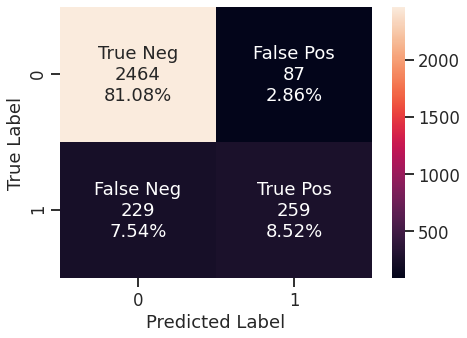

In [108]:
# Creating the Confusion Matrix
make_confusion_matrix(lr_original, y_test)

In [109]:
# Model Metrics
lr_original_metrics = get_metrics_score(model = lr_original, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.901
Test Accuracy           = 0.896
Average Train Recall    = 0.553
Test Recall             = 0.531
Average Train Precision = 0.768
Test Precision          = 0.749
Average Train F1 Score  = 0.641
Test F1 Score           = 0.621
ROC AUC Score           = 0.898


- Results for the Logistic Regression Classifier without Up-Sampling or Down-sampling, and with default parameters:

    Average Cross-validated Train Accuracy = 0.901 | Test Accuracy = 0.896\
    Average Cross-validated Train Recall   = 0.553 | Test Recall   = 0.531
    
- Both Average Cross-validated Train and Test Set Accuracies are relatively close (range 0.896 - 0.901). This doesn't seem to represent an overfitting problem, however the class imbalance for the target variable may turn the Accuracy a misleading metric (Accuracy Paradox). This will be confirmed in the next steps with Up-sampling and Down-sampling model fitting strategies.

- Both Average Cross-validated Train and Test Set Recalls are relatively close (range 0.531 - 0.553). These values for Recall are not good enough - some possible improvements with up-sampling and down-sampling will be explored in the next steps.

### 4.2 - Logistic Regression with Up-Sampling ('SMOTE')

In [110]:
# Creating the Pipeline Object and Fitting the Model
lr_SMOTE = Pipeline(steps = [('SMOTE Up-sampling', SMOTE(k_neighbors = n_Folds, random_state = seed)),
                             ("scaler", StandardScaler()),
                             ("log_reg", LogisticRegression(random_state = seed))])

lr_SMOTE.fit(X_train, y_train)

Pipeline(steps=[('SMOTE Up-sampling', SMOTE(random_state=1)),
                ('scaler', StandardScaler()),
                ('log_reg', LogisticRegression(random_state=1))])

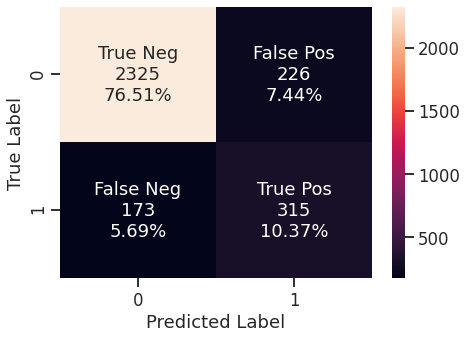

In [111]:
# Creating the Confusion Matrix
make_confusion_matrix(lr_SMOTE, y_test)

In [112]:
# Model Metrics
lr_SMOTE_metrics = get_metrics_score(model = lr_SMOTE, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.868
Test Accuracy           = 0.869
Average Train Recall    = 0.637
Test Recall             = 0.645
Average Train Precision = 0.583
Test Precision          = 0.582
Average Train F1 Score  = 0.608
Test F1 Score           = 0.612
ROC AUC Score           = 0.879


- Results for the Logistic Regression Classifier with Up-Sampling (SMOTE), and with default parameters:

    Average Cross-validated Train Accuracy = 0.868 | Test Accuracy = 0.869\
    Average Cross-validated Train Recall   = 0.637 | Test Recall   = 0.645
    
- Both Average Cross-validated Train and Test Set Accuracies are relatively close (range 0.868 - 0.869) - model is not exhibiting overfitting.

- Both Average Cross-validated Train and Test Set Recalls are relatively close (range 0.637 - 0.645). There is an improvement on Recall compared to the results from the Logistic Regression Classifier without Up-Sampling or Down-sampling (where the test Recall was 0.531), however these results are still not good enough.

### 4.3 - Logistic Regression with Down-Sampling ('RandomUnderSampler')

In [113]:
# Creating the Pipeline Object and Fitting the Model
lr_RandomUnderSampler = Pipeline(steps = [('RandomUnderSampler Down-sampling', RandomUnderSampler(random_state = seed)),
                             ("scaler", StandardScaler()),
                             ("log_reg", LogisticRegression(random_state = seed))])

lr_RandomUnderSampler.fit(X_train, y_train)

Pipeline(steps=[('RandomUnderSampler Down-sampling',
                 RandomUnderSampler(random_state=1)),
                ('scaler', StandardScaler()),
                ('log_reg', LogisticRegression(random_state=1))])

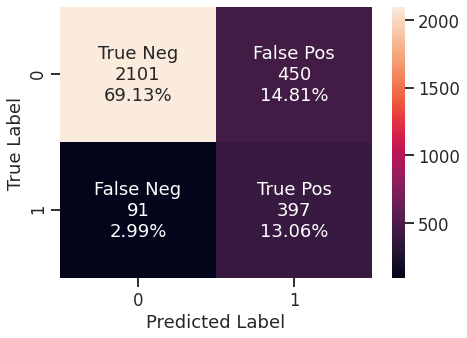

In [114]:
# Creating the Confusion Matrix
make_confusion_matrix(lr_RandomUnderSampler, y_test)

In [115]:
# Model Metrics
lr_RandomUnderSampler_metrics = get_metrics_score(model = lr_RandomUnderSampler, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.83
Test Accuracy           = 0.822
Average Train Recall    = 0.824
Test Recall             = 0.814
Average Train Precision = 0.482
Test Precision          = 0.469
Average Train F1 Score  = 0.608
Test F1 Score           = 0.595
ROC AUC Score           = 0.896


- Results for the Logistic Regression Classifier with Down-Sampling ('RandomUnderSampler'), and with default parameters:

    Average Cross-validated Train Accuracy = 0.830 | Test Accuracy = 0.822\
    Average Cross-validated Train Recall   = 0.824 | Test Recall   = 0.814
    
- Both Average Cross-validated Train and Test Set Accuracies are relatively close (range 0.822 - 0.830) - model is not exhibiting overfitting.

- Both Average Cross-validated Train and Test Set Recalls are relatively close (range 0.814 - 0.824). There is a relevant improvement on Recall compared to the results from the Logistic Regression Classifier with Up-Sampling, where the test Recall was 0.645.

### 4.4 - Remarks about Regularization

- The main reason for using regularization is to overcome the problem of overfitting. When the model overfits the training data (capture all noise as well), Regularization will penalize the weights for the model coefficients, enabling to select a better balance between underfitting (high bias & low variance) and overfitting (low bias & high variance).

- Because none of Logistic Regression models exhibited overfitting, the Regularization technique will not be utilized.

### 4.5 - Comparing all Models

In [116]:
# Defining list of models
models = [lr_original, lr_SMOTE, lr_RandomUnderSampler]

# Defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
F1_train = []
F1_test = []
ROC_AUC_score = []

# Looping through all the models to get the metrics
for model in models:
    j = get_metrics_score(model, n_Folds, seed, False)
    acc_train.append(np.round(j[0],3))
    acc_test.append(np.round(j[1],3))
    recall_train.append(np.round(j[2],3))
    recall_test.append(np.round(j[3],3))
    precision_train.append(np.round(j[4],3))
    precision_test.append(np.round(j[5],3))
    F1_train.append(np.round(j[6],3))
    F1_test.append(np.round(j[7],3))
    ROC_AUC_score.append(np.round(j[8],3))

In [117]:
# Creating a comparison dataframe with the metrics for all the models 
comparison_frame = pd.DataFrame({'Model':['Logistic Regression','Log. Regr. Oversampled', 'Log. Regr. Undersampled'],
                                 'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                 'Train_Recall':recall_train,'Test_Recall':recall_test,
                                 'Train_Precision':precision_train,'Test_Precision':precision_test,
                                 'Train_F1_Score':F1_train,'Test_F1_Score':F1_test,
                                 'ROC_AUC_Score':ROC_AUC_score}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1_Score,Test_F1_Score,ROC_AUC_Score
0,Logistic Regression,0.901,0.896,0.553,0.531,0.768,0.749,0.641,0.621,0.898
1,Log. Regr. Oversampled,0.868,0.869,0.637,0.645,0.583,0.582,0.608,0.612,0.879
2,Log. Regr. Undersampled,0.830,0.822,0.824,0.814,0.482,0.469,0.608,0.595,0.896


In [118]:
# Sorting the models by Recall (ascending order)
comparison_frame.sort_values(["Test_Recall"], ascending = True, inplace = True)

In [119]:
# Data preparation to create a lineplot with a hue per metric
comparison_frame_melted = pd.melt(frame = comparison_frame, id_vars=['Model'], value_name = 'Metric Value')

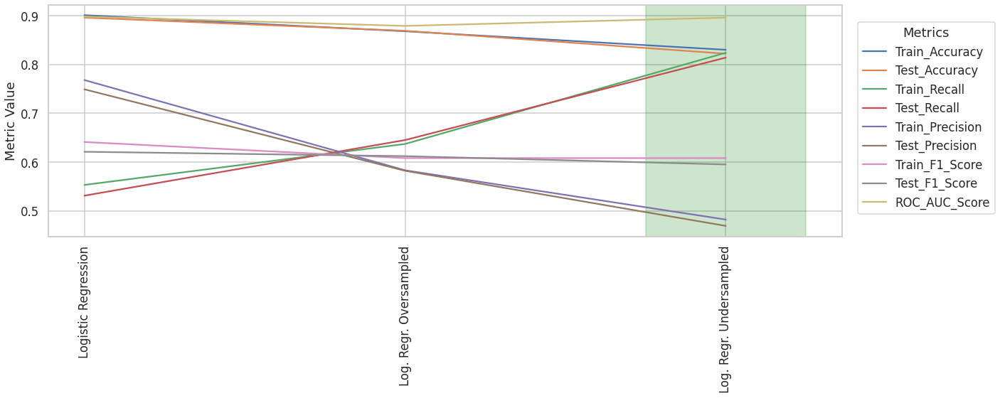

In [120]:
# Lineplot with a hue per metric for all the models, sorted by Recall on the Test Set
sns.set({'figure.figsize': (20,6)})
sns.set_style("whitegrid")
sns.set_context("talk")
chart = sns.lineplot(x = "Model", y = "Metric Value", hue = "variable", data = comparison_frame_melted)
chart.figure.canvas.draw()
x = chart.get_xticklabels()
chart.set_xticklabels(x, rotation = 90)
chart.legend(loc = 'upper right', title = 'Metrics', bbox_to_anchor=(1.2, 0.95))
chart.axvspan(1.75, 2.25, color = 'green', alpha = 0.2)
chart.set(xlabel = None);

- Logistic Regression with under-sampling exhibited the best generalized performance for Recall:

    Average Cross-validated Train Accuracy = 0.830 | Test Accuracy = 0.822\
    Average Cross-validated Train Recall   = 0.824 | Test Recall   = 0.814

### 4.6 - Finding the Coefficients and Creating Partial Dependence Plots for the Best Model

In [121]:
## Feature Importance or Absolute Coefficients 
fi = pd.DataFrame()
fi['Col'] = X_train.columns
fi['Coeff'] = lr_RandomUnderSampler._final_estimator.coef_[0]
fi['Abs Coeff'] = abs(lr_RandomUnderSampler._final_estimator.coef_[0])
fi = fi.sort_values(by = 'Abs Coeff', ascending = False)
fi.head(10)

,Col,Coeff,Abs Coeff
8,Total_Trans_Ct,-1.541509,1.541509
6,Total_Revolving_Bal,-0.724048,0.724048
2,Total_Relationship_Count,-0.720806,0.720806
9,Total_Ct_Chng_Q4_Q1,-0.640713,0.640713
4,Contacts_Count_12_mon,0.544204,0.544204
3,Months_Inactive_12_mon,0.450519,0.450519
21,Income_Category_Less than $40K,0.262254,0.262254
14,Education_Level_Post-Graduate,0.186342,0.186342
24,Card_Category_Silver,0.156770,0.156770
22,Card_Category_Gold,0.142141,0.142141


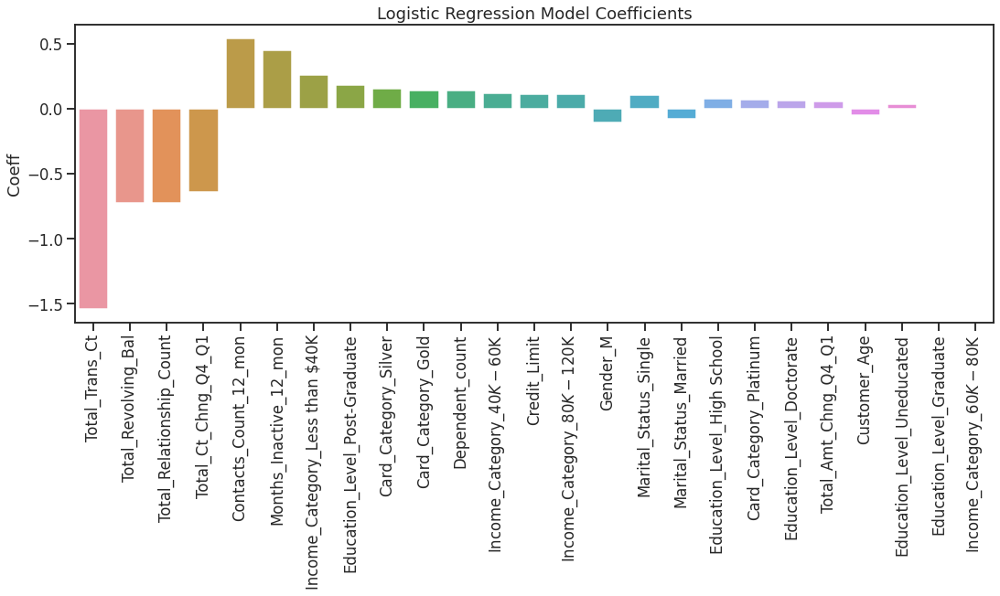

In [122]:
sns.set({'figure.figsize': (18, 6)})
sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("talk")
g = sns.barplot(x = "Col", y = "Coeff", order = fi['Col'], data = fi)
g.set_xticklabels(g.get_xticklabels(), rotation = 90)
g.set(xlabel = None)
plt.title('Logistic Regression Model Coefficients');

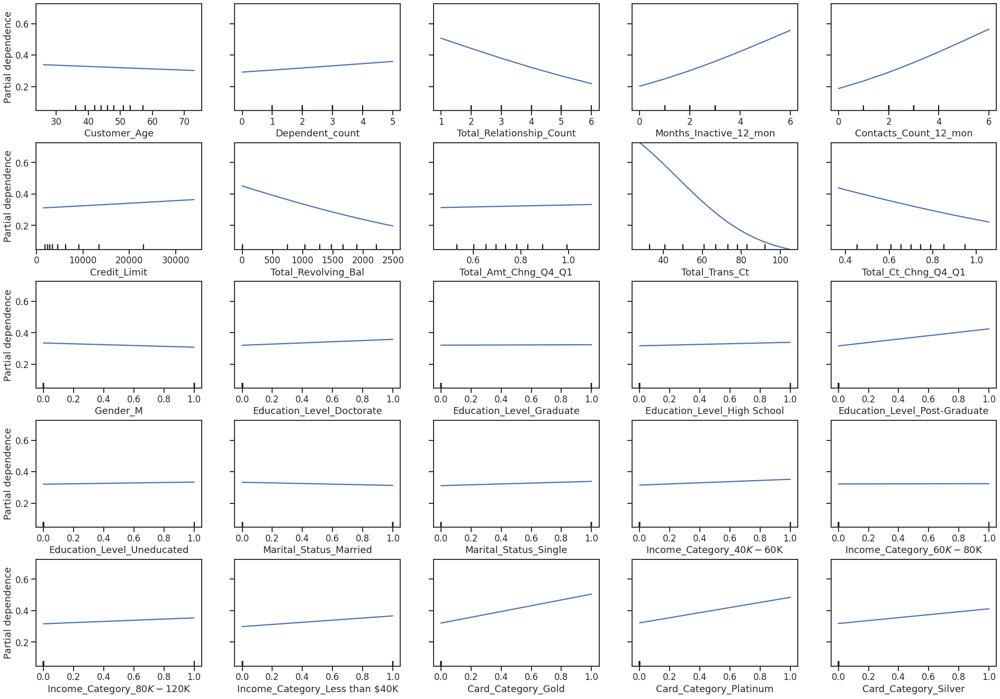

In [123]:
# Creation of Partial Dependence Plot for all Variables
# Partial Dependence Plots (PDP) show the dependence between the target response and a set of input features of interest.
# Intuitively, we can interpret the partial dependence as the expected target response as a function of the input features of interest.
feature_names = list(X_train.columns)
plot_partial_dependence(estimator = lr_RandomUnderSampler, X = X_train, features = feature_names, n_cols = 5)
fig = plt.gcf()
fig.subplots_adjust(left = 0, right = 1.4, bottom = 0.01, hspace = 0.3)
fig.set_figheight(20)

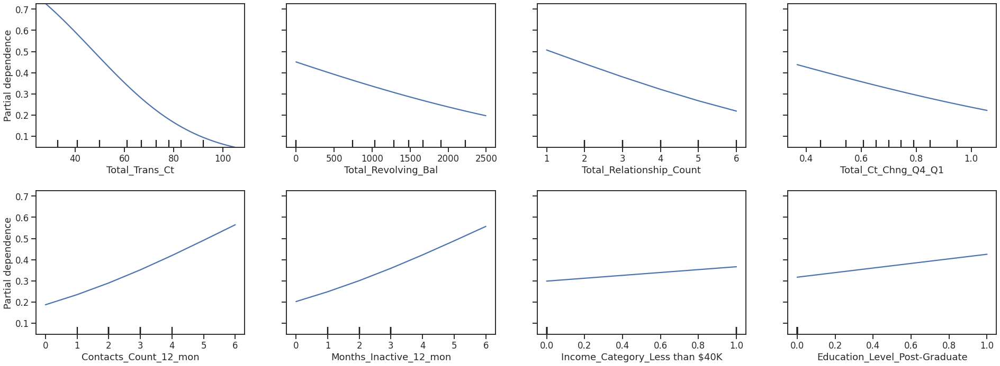

In [124]:
# Creation of Partial Dependence Plot for Top 08 Variables
feature_names = ['Total_Trans_Ct', 'Total_Revolving_Bal' , 'Total_Relationship_Count', 'Total_Ct_Chng_Q4_Q1',
                 'Contacts_Count_12_mon', 'Months_Inactive_12_mon', 'Income_Category_Less than $40K', 'Education_Level_Post-Graduate']
plot_partial_dependence(estimator = lr_RandomUnderSampler, X = X_train, features = feature_names, n_cols = 4)
fig = plt.gcf()
fig.subplots_adjust(left = 0, right = 1.4, bottom = 0.01, hspace = 0.3)
fig.set_figheight(10)

### 4.7 - Models Performance Summary

- As per the Model Coefficients and the Partial Dependence Plot, the most important features are:

    'Total_Trans_Ct', 'Total_Revolving_Bal', 'Total_Relationship_Count', 'Total_Ct_Change_Q4_Q1' - negative coefficients and also negative slopes on the Partial Dependence Plot, meaning that, on average, there will be less attrited Customers by increasing the magnitude of these variables. For the variables with negative effect, the 'Total_Trans_Ct' is the most significant - largest absolute coefficient and more pronounced negative slope on the Partial Dependence Plot.
    
    'Contacts_Count_12_mon', 'Months_Inactive_12_mon', 'Income_Category_Less than $40K', 'Education_Level_Post-Graduate' - positive coefficients and also positive slopes on the Partial Dependence Plot, meaning that, on average, there will be more attrited Customers by increasing the magnitude of these variables. For the variables with positive effect, the 'Months_Inactive_12_mon' is the most significant - largest absolute coefficient and more pronounced positive slope on the Partial Dependence Plot.
    
- As a sense checking, these results are matching what was seen at the previous EDA session.

***
## 5. Model Building - Bagging and Boosting <a class="anchor" id="55"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
    
- Build Decision tree, random forest, bagging classifier models
- Build Xgboost, AdaBoost, and gradient boosting models

### 5.1 - Data Pre-processing for Bagging and Boosting Models (Dummy Variables)

In [125]:
# Re-assigning X_train and X_test Datasets
X_train = X_train_copy
X_test = X_test_copy

In [126]:
# Convert Categorical/Nominal Variables into Dummy Variables without Dropping the First Column
# If dropping the first category, it may break the symmetry of the original representation and can therefore induce a bias in downstream tree-based models.
X_train = pd.get_dummies(X_train, drop_first = False)
X_test = pd.get_dummies(X_test, drop_first = False)

print(X_train.shape, X_test.shape)

(7088, 30) (3039, 30)


In [127]:
X_train.head()

,Customer_Age,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,50.0,1.0,6.0,1.0,2.0,7985.0,0.0,1.032,72.0,0.674,...,0,0,1,0,0,0,1,0,0,0
1,50.0,0.0,3.0,3.0,2.0,5444.0,2499.0,0.468,80.0,0.667,...,0,0,0,1,0,0,1,0,0,0
2,26.0,0.0,6.0,3.0,4.0,1643.0,1101.0,0.713,50.0,0.471,...,1,0,1,0,0,0,1,0,0,0
3,65.0,0.0,3.0,3.0,0.0,2022.0,0.0,0.579,65.0,0.548,...,1,0,0,0,0,1,1,0,0,0
4,46.0,3.0,6.0,3.0,4.0,4930.0,0.0,1.019,77.0,0.638,...,1,0,0,0,1,0,1,0,0,0


- Dummy variables were created for all the Categorical/Nominal variables without dropping the first column.

- Data is now ready for bulding the Bagging and Boosting classification models.

### 5.2 - Bagging and Boosting Models Building with Default Parameters and Original Sampling

In [128]:
# Building all Bagging and Boosting Models with Original Sampling
models = []  # Empty list to store all the models

# Appending pipelines for each model into the list
models.append(("1_DTREE", Pipeline(steps = [("scaler", StandardScaler()),
                                            ("decision_tree", DecisionTreeClassifier(random_state = seed))])))

models.append(("2_RF   ", Pipeline(steps = [("scaler", StandardScaler()),
                                            ("random_forest", RandomForestClassifier(random_state = seed))])))

models.append(("3_BC   ", Pipeline(steps = [("scaler", StandardScaler()),
                                            ("random_forest", BaggingClassifier(random_state = seed))])))

models.append(("4_GB   ", Pipeline(steps = [("scaler", StandardScaler()),
                                            ("gradient_boosting", GradientBoostingClassifier(random_state = seed))])))

models.append(("5_ADB  ", Pipeline(steps = [("scaler", StandardScaler()),
                                            ("adaboost", AdaBoostClassifier(random_state = seed))])))

models.append(("6_XGB  ", Pipeline(steps = [("scaler", StandardScaler()),
                                            ("xgboost", XGBClassifier(eval_metric = "logloss", random_state = seed))])))

results_Original_train = []  # Empty list to store all model's CV scores
results_Original_test = [] # Empty list to store all model's Test scores
names = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print("Original Cross-validated Train Scores - Recall")
print()
for name, model in models:
    kfold = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed)  # Setting number of splits equal to 5
    cv_result = cross_val_score(estimator = model, X = X_train, y = y_train, scoring = scoring, cv = kfold)
    
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    test_recall = round(recall_score(y_test, y_pred_test), 3)
    
    results_Original_train.append(cv_result)
    results_Original_test.append(test_recall)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean()))

Original Cross-validated Train Scores - Recall

1_DTREE: 0.6848210835458691
2_RF   : 0.6426694489527784
3_BC   : 0.6654880593554371
4_GB   : 0.7006337429476777
5_ADB  : 0.7006337429476776
6_XGB  : 0.7436239276605611


In [129]:
# Compiling Results on All Models for Training Set Cross-validation and Test Set Prediction
results_Original_train = pd.DataFrame(results_Original_train,
                                       index = names).reset_index().melt(id_vars = ['index'],
                                                                         value_name = 'Score').sort_values(["index", "variable"], ascending = True)

results_Original_test = pd.DataFrame(results_Original_test, index = names, columns = ["Score"]).reset_index()

### 5.3 - Bagging and Boosting Models Building with Default Parameters and Over-sampling (SMOTE)

In [130]:
# Building all Bagging and Boosting Models with Over-sampling (SMOTE)
models = []  # Empty list to store all the models

# Appending pipelines for each model into the list
models.append(("1_DTREE", Pipeline(steps = [('SMOTE Up-sampling', SMOTE(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("decision_tree", DecisionTreeClassifier(random_state = seed))])))

models.append(("2_RF   ", Pipeline(steps = [('SMOTE Up-sampling', SMOTE(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("random_forest", RandomForestClassifier(random_state = seed))])))

models.append(("3_BC   ", Pipeline(steps = [('SMOTE Up-sampling', SMOTE(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("random_forest", BaggingClassifier(random_state = seed))])))

models.append(("4_GB   ", Pipeline(steps = [('SMOTE Up-sampling', SMOTE(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("gradient_boosting", GradientBoostingClassifier(random_state = seed))])))

models.append(("5_ADB  ", Pipeline(steps = [('SMOTE Up-sampling', SMOTE(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("adaboost", AdaBoostClassifier(random_state = seed))])))

models.append(("6_XGB  ", Pipeline(steps = [('SMOTE Up-sampling', SMOTE(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("xgboost", XGBClassifier(eval_metric = "logloss", random_state = seed))])))

results_SMOTE_train = []  # Empty list to store all model's CV scores
results_SMOTE_test = [] # Empty list to store all model's Test scores
names = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print("Over-sampled Cross-validated Train Scores - Recall")
print()
for name, model in models:
    kfold = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed)  # Setting number of splits equal to 5
    cv_result = cross_val_score(estimator = model, X = X_train, y = y_train, scoring = scoring, cv = kfold)
    
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    test_recall = round(recall_score(y_test, y_pred_test), 3)
    
    results_SMOTE_train.append(cv_result)
    results_SMOTE_test.append(test_recall)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean()))

Over-sampled Cross-validated Train Scores - Recall

1_DTREE: 0.6742986320426617
2_RF   : 0.6926964989566426
3_BC   : 0.7103021871860269
4_GB   : 0.7489257284179611
5_ADB  : 0.7585864440837777
6_XGB  : 0.7436355205193601


In [131]:
# Compiling Results on All Models for Training Set Cross-validation and Test Set Prediction
results_SMOTE_train = pd.DataFrame(results_SMOTE_train,
                                       index = names).reset_index().melt(id_vars = ['index'],
                                                                         value_name = 'Score').sort_values(["index", "variable"], ascending = True)

results_SMOTE_test = pd.DataFrame(results_SMOTE_test, index = names, columns = ["Score"]).reset_index()

### 5.4 - Bagging and Boosting Models Building with Default Parameters and Under-sampling (RandomUnderSampler)

In [132]:
# Building all Bagging and Boosting Models with Under-sampling (RandomUnderSampler)
models = []  # Empty list to store all the models

# Appending pipelines for each model into the list
models.append(("1_DTREE", Pipeline(steps = [('Under-sampling', RandomUnderSampler(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("decision_tree", DecisionTreeClassifier(random_state = seed))])))

models.append(("2_RF   ", Pipeline(steps = [('Under-sampling', RandomUnderSampler(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("random_forest", RandomForestClassifier(random_state = seed))])))

models.append(("3_BC   ", Pipeline(steps = [('Under-sampling', RandomUnderSampler(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("random_forest", BaggingClassifier(random_state = seed))])))

models.append(("4_GB   ", Pipeline(steps = [('Under-sampling', RandomUnderSampler(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("gradient_boosting", GradientBoostingClassifier(random_state = seed))])))

models.append(("5_ADB  ", Pipeline(steps = [('Under-sampling', RandomUnderSampler(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("adaboost", AdaBoostClassifier(random_state = seed))])))

models.append(("6_XGB  ", Pipeline(steps = [('Under-sampling', RandomUnderSampler(random_state = seed)),
                                            ("scaler", StandardScaler()),
                                            ("xgboost", XGBClassifier(eval_metric = "logloss", random_state = seed))])))

results_UnderSamp_train = []  # Empty list to store all model's Train CV scores
results_UnderSamp_test = [] # Empty list to store all model's Test scores
names = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print()
print("Under-sampled Cross-validated Train Scores - Recall")
print()
for name, model in models:
    kfold = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed)  # Setting number of splits equal to 5
    cv_result = cross_val_score(estimator = model, X = X_train, y = y_train, scoring = scoring, cv = kfold)
    
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    test_recall = round(recall_score(y_test, y_pred_test), 3)
    
    results_UnderSamp_train.append(cv_result)
    results_UnderSamp_test.append(test_recall)
    names.append(name)
    
    print("{}: {}(CV Train Set Average) | {}(Test Set)".format(name, round(cv_result.mean(), 3), test_recall))


Under-sampled Cross-validated Train Scores - Recall

1_DTREE: 0.807(CV Train Set Average) | 0.828(Test Set)
2_RF   : 0.881(CV Train Set Average) | 0.873(Test Set)
3_BC   : 0.838(CV Train Set Average) | 0.861(Test Set)
4_GB   : 0.888(CV Train Set Average) | 0.904(Test Set)
5_ADB  : 0.865(CV Train Set Average) | 0.871(Test Set)
6_XGB  : 0.894(CV Train Set Average) | 0.904(Test Set)


In [133]:
# Compiling Results on All Models for Training Set Cross-validation and Test Set Prediction
results_UnderSamp_train = pd.DataFrame(results_UnderSamp_train,
                                       index = names).reset_index().melt(id_vars = ['index'],
                                                                         value_name = 'Score').sort_values(["index", "variable"], ascending = True)

results_UnderSamp_test = pd.DataFrame(results_UnderSamp_test, index = names, columns = ["Score"]).reset_index()

### 5.5 - Summary for Bagging and Boosting Models Building with Default Parameters

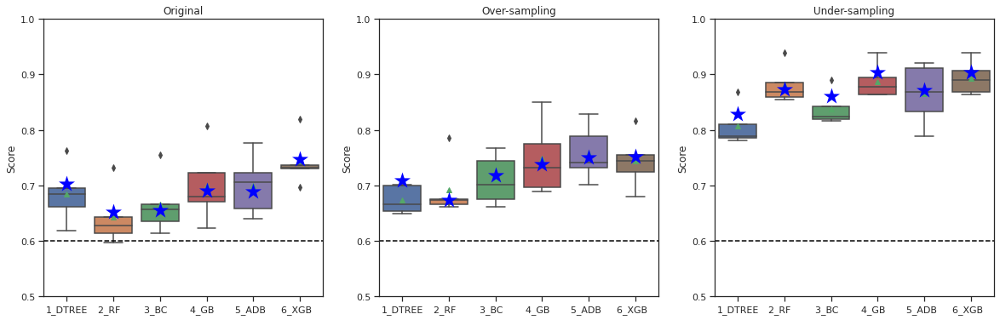

In [134]:
# Box Plots with the Summary for all Models
# Points and Boxes represent the Cross-validated results on the Training Set
# Blue stars represent the Test Set Prediction on each model
sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("notebook")
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
a = sns.boxplot(x = "index", y = "Score", data = results_Original_train, showmeans = True, ax = axs[0])
a.axhline(0.6, color = 'black', linestyle = '--') 
sns.stripplot(x = "index", y = "Score", data = results_Original_test, size = 20, marker='*', color = "blue", jitter = False, ax = axs[0]).set(title = "Original")
a.set_ylim([0.5, 1])
a.set(xlabel = None)
b = sns.boxplot(x = "index", y = "Score", data = results_SMOTE_train, showmeans = True, ax = axs[1])
b.axhline(0.6, color = 'black', linestyle = '--') 
sns.stripplot(x = "index", y = "Score", data = results_SMOTE_test, size = 20, marker='*', color = "blue", jitter = False, ax = axs[1]).set(title = "Over-sampling")
b.set_ylim([0.5, 1])
b.set(xlabel = None)
c = sns.boxplot(x = "index", y = "Score", data = results_UnderSamp_train, showmeans = True, ax = axs[2])
c.axhline(0.6, color = 'black', linestyle = '--')
sns.stripplot(x = "index", y = "Score", data = results_UnderSamp_test, size = 20, marker='*', color = "blue", jitter = False, ax = axs[2]).set(title = "Under-sampling")
c.set_ylim([0.5, 1])
c.set(xlabel = None);

- As seen in the Logistic Regression Models, the results for the Bagging and Boosting models with Under-sampling are considerably better than the results for Original Sampling and Over-sampling. Because of that, all the subsequent steps for model tunning will include the random under-sampling technique into their respective Pipelines.

- Random Forest (RF), Gradient Boosting (GB), AdaBoost (ADB) and XGBoost (XGB) were the top performer models for Recall on Under-sampling models. Also their Test Set predictions (blue stars) were very close to the average cross-validated train set Recall, meaning there aren't any relevant overfit issues associated with these models.

***
## 6. Hyperparameters Tuning using Grid Search <a class="anchor" id="66"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
    
- Tune all the models using grid search
- Use pipelines in hyperparameter tuning

In [135]:
# Initializing a List for Capturing the Running Time for each Tuned Model using Grid Search
time_list_GS = []

### 6.1 - Hyperparameters Tuning - Decision Tree Classifier using Grid Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_DTREE_GS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('DecisionTree', DecisionTreeClassifier(random_state = seed))])

# Parameter grid to pass in GridSearchCV
parameters = {'DecisionTree__max_depth' : np.arange(1, 5),
              'DecisionTree__criterion' : ['entropy','gini'],
              'DecisionTree__splitter' : ['best','random'],
              'DecisionTree__min_samples_leaf' : [1, 2, 5, 7, 10, 15, 20],
              'DecisionTree__max_leaf_nodes' : [2, 3, 5, 10],
              'DecisionTree__min_impurity_decrease' : [0.0001, 0.001, 0.01]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator = pipe_DTREE_GS, param_grid = parameters, scoring = scorer,
                       cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_DTREE_GS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_DTREE_GS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

DTREE_time = time() - tic
print("done in {:.3f}s".format(DTREE_time))

# Appending the Model Name and the Running Time into the time_list
time_list_GS.append(["Decision Tree", round(DTREE_time), test_recall])

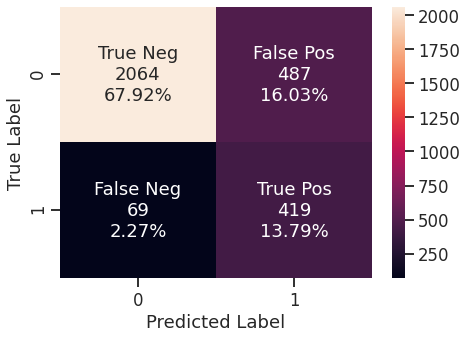

In [137]:
# Creating confusion matrix
make_confusion_matrix(pipe_DTREE_GS, y_test)

In [138]:
pipe_DTREE_GS_score = get_metrics_score(model = pipe_DTREE_GS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.795
Test Accuracy           = 0.817
Average Train Recall    = 0.893
Test Recall             = 0.859
Average Train Precision = 0.433
Test Precision          = 0.462
Average Train F1 Score  = 0.583
Test F1 Score           = 0.601
ROC AUC Score           = 0.904


- Results for the Tuned (Grid Search) Decision Tree Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.795 | Test Accuracy = 0.817\
    Average Cross-validated Train Recall   = 0.893 | Test Recall   = 0.859

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.795 - 0.817). Average Cross-validated Train and Test Recalls are relatively close (range 0.859 - 0.893) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.859), meaning the model is doing a good job at identifying potential attrited Customers. The Test Recall with hyperparameters tuning using Grid Search increased by ~4% compared to the same classifier without tuning. 

- Reference (previous results for the same model classifier with default hyperparameters): 1_DTREE: 0.807(CV Train Set Average) | 0.828(Test Set)

### 6.2 - Hyperparameters Tuning - Random Forest Classifier using Grid Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_RF_GS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('RandomForest', RandomForestClassifier(random_state = seed))])

# Parameter grid to pass in GridSearchCV
parameters = {'RandomForest__max_features': [0.3, 0.6, 0.9],
              'RandomForest__max_samples' : [0.7, 0.8, 0.9],
              'RandomForest__min_samples_leaf' : [2, 4, 6],
              'RandomForest__n_estimators' : [100, 200, 300]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator = pipe_RF_GS, param_grid = parameters, scoring = scorer,
                       cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_RF_GS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_RF_GS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

RF_time = time() - tic
print("done in {:.3f}s".format(RF_time))

# Appending the Model Name and the Running Time into the time_list
time_list_GS.append(["Random Forest", round(RF_time), test_recall])

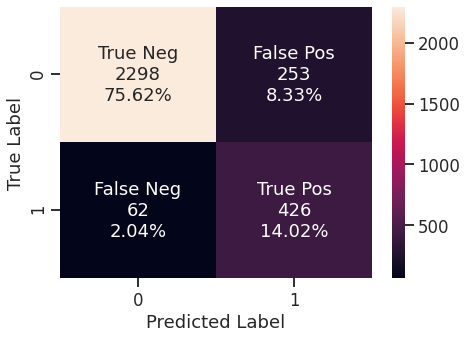

In [140]:
# Creating confusion matrix
make_confusion_matrix(pipe_RF_GS, y_test)

In [141]:
pipe_RF_GS_score = get_metrics_score(model = pipe_RF_GS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.889
Test Accuracy           = 0.896
Average Train Recall    = 0.893
Test Recall             = 0.873
Average Train Precision = 0.606
Test Precision          = 0.627
Average Train F1 Score  = 0.721
Test F1 Score           = 0.73
ROC AUC Score           = 0.954


- Results for the Tuned (Grid Search) Random Forest Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.889 | Test Accuracy = 0.896\
    Average Cross-validated Train Recall   = 0.893 | Test Recall   = 0.873

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.889 - 0.896). Average Cross-validated Train and Test Recalls are relatively close (range 0.873 - 0.893) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.873), meaning the model is doing a good job at identifying potential attrited Customers. The Test Recall with hyperparameters tuning using Grid Search stayed the same as the same classifier without tuning. 

- Reference (previous results for the same model classifier with default hyperaprameters): 2_RF   : 0.881(CV Train Set Average) | 0.873(Test Set)

### 6.3 - Hyperparameters Tuning - Bagging Classifier using Grid Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_BC_GS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('Bagging', BaggingClassifier(random_state = seed))])

dtc = DecisionTreeClassifier(random_state = seed)
lr = LogisticRegression(random_state = seed)

# Grid of parameters to choose from
parameters = {'Bagging__base_estimator' : [dtc, lr],
              'Bagging__max_samples': [0.7, 0.8, 0.9],
              'Bagging__max_features': [0.7, 0.8, 0.9],
              'Bagging__n_estimators' : [25, 35, 45, 55, 65]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator = pipe_BC_GS, param_grid = parameters, scoring = scorer,
                       cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_BC_GS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_BC_GS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

BC_time = time() - tic
print("done in {:.3f}s".format(BC_time))

# Appending the Model Name and the Running Time into the time_list
time_list_GS.append(["Bagging", round(BC_time), test_recall])

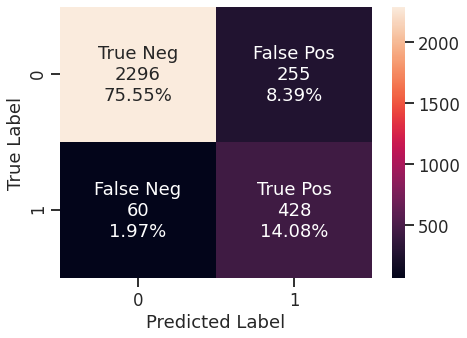

In [143]:
# Creating confusion matrix
make_confusion_matrix(pipe_BC_GS, y_test)

In [144]:
pipe_BC_GS_score = get_metrics_score(model = pipe_BC_GS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.894
Test Accuracy           = 0.896
Average Train Recall    = 0.893
Test Recall             = 0.877
Average Train Precision = 0.619
Test Precision          = 0.627
Average Train F1 Score  = 0.731
Test F1 Score           = 0.731
ROC AUC Score           = 0.954


- Results for the Tuned (Grid Search) Bagging Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.894 | Test Accuracy = 0.896\
    Average Cross-validated Train Recall   = 0.893 | Test Recall   = 0.877

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.894 - 0.896). Average Cross-validated Train and Test Recalls are relatively close (range 0.877 - 0.893) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.877), meaning the model is doing a good job at identifying potential attrited Customers. The Test Recall with hyperparameters tuning using Grid Search increased by ~2% compared to the same classifier without tuning. 

- Reference (previous results for the same model classifier with default hyperparameters): 3_BC   : 0.838(CV Train Set Average) | 0.861(Test Set)

### 6.4 - Hyperparameters Tuning - Gradient Boosting Classifier using Grid Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_GB_GS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('GradientBoosting', GradientBoostingClassifier(random_state = seed))])

# Grid of parameters to choose from
parameters = {"GradientBoosting__init" : [None, AdaBoostClassifier(random_state = 1)],
              "GradientBoosting__n_estimators" : [100, 150, 200],
              "GradientBoosting__subsample" :[0.8, 0.9, 1],
              "GradientBoosting__max_features" :[0.5, 0.6, 0.7, 0.8, 0.9]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator = pipe_GB_GS, param_grid = parameters, scoring = scorer,
                       cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters

pipe_GB_GS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_GB_GS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

GB_time = time() - tic
print("done in {:.3f}s".format(GB_time))

# Appending the Model Name and the Running Time into the time_list
time_list_GS.append(["Gradient Boosting", round(GB_time), test_recall])

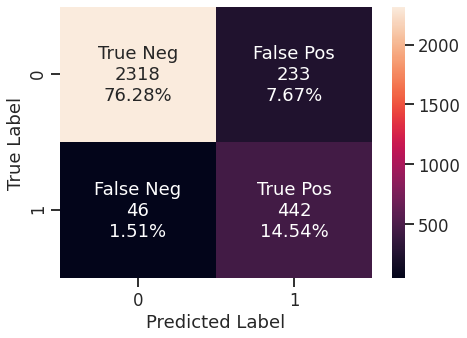

In [146]:
# Creating confusion matrix
make_confusion_matrix(pipe_GB_GS, y_test)

In [147]:
pipe_GB_GS_score = get_metrics_score(model = pipe_GB_GS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.899
Test Accuracy           = 0.908
Average Train Recall    = 0.9
Test Recall             = 0.906
Average Train Precision = 0.63
Test Precision          = 0.655
Average Train F1 Score  = 0.741
Test F1 Score           = 0.76
ROC AUC Score           = 0.966


- Results for the Tuned (Grid Search) Gradient Boosting Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.899 | Test Accuracy = 0.908\
    Average Cross-validated Train Recall   = 0.900 | Test Recall   = 0.906

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.899 - 0.908). Average Cross-validated Train and Test Recalls are relatively close (range 0.900 - 0.906) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.906), meaning the model is doing a good job at identifying potential attrited Customers. The Test Recall with hyperparameters tuning using Grid Search stayed almost the same compared to the same classifier without tuning.

- Reference (previous results for the same model classifier with default hyperparameters):  4_GB   : 0.888(CV Train Set Average) | 0.904(Test Set)

### 6.5 - Hyperparameters Tuning - Adaptive Boosting Classifier using Grid Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_ADB_GS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('AdaBoost', AdaBoostClassifier(random_state = seed))])

# Grid of parameters to choose from
parameters = {"AdaBoost__base_estimator" : [DecisionTreeClassifier(max_depth = 1), DecisionTreeClassifier(max_depth = 2), DecisionTreeClassifier(max_depth = 3)],
              "AdaBoost__n_estimators" : [25, 50, 75, 100, 125],
              "AdaBoost__learning_rate" : [0.1, 0.3, 0.5, 0.7, 0.9]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator = pipe_ADB_GS, param_grid = parameters, scoring = scorer,
                       cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_ADB_GS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_ADB_GS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

ADB_time = time() - tic
print("done in {:.3f}s".format(ADB_time))

# Appending the Model Name and the Running Time into the time_list
time_list_GS.append(["Adaptive Boosting", round(ADB_time), test_recall])

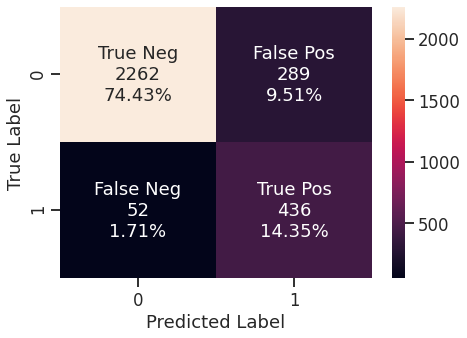

In [149]:
# Creating confusion matrix
make_confusion_matrix(pipe_ADB_GS, y_test)

In [150]:
pipe_ADB_GS_score = get_metrics_score(model = pipe_ADB_GS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.886
Test Accuracy           = 0.888
Average Train Recall    = 0.896
Test Recall             = 0.893
Average Train Precision = 0.597
Test Precision          = 0.601
Average Train F1 Score  = 0.716
Test F1 Score           = 0.719
ROC AUC Score           = 0.946


- Results for the Tuned (Grid Search) Adaptive Boosting Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.886 | Test Accuracy = 0.888\
    Average Cross-validated Train Recall   = 0.896 | Test Recall   = 0.893

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.886 - 0.888). Average Cross-validated Train and Test Recalls are relatively close (range 0.893 - 0.896) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.893, meaning the model is doing a good job at identifying potential attrited Customers. The Test Recall with hyperparameters tuning using Grid Search increased by ~3% compared to the same classifier without tuning.

- Reference (previous results for the same model classifier with default hyperparameters): 5_ADB  : 0.865(CV Train Set Average) | 0.871(Test Set)

### 6.6 - Hyperparameters Tuning - XGBoost Classifier using Grid Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_XGB_GS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('XGBoost', XGBClassifier(random_state = seed, eval_metric = "logloss"))])

# Grid of parameters to choose from
parameters = {"XGBoost__n_estimators" : np.arange(50, 250, 50),
              "XGBoost__subsample" : [0.4, 0.6, 0.8, 1],
              "XGBoost__learning_rate" : [0.2, 0.3, 0.4],
              "XGBoost__gamma" : [0, 5, 10],
              "XGBoost__colsample_bylevel" : [0.2, 0.6, 1]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator = pipe_XGB_GS, param_grid = parameters, scoring = scorer,
                       cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_XGB_GS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_XGB_GS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

XGB_time = time() - tic
print("done in {:.3f}s".format(XGB_time))

# Appending the Model Name and the Running Time into the time_list
time_list_GS.append(["XGBoosting", round(XGB_time), test_recall])

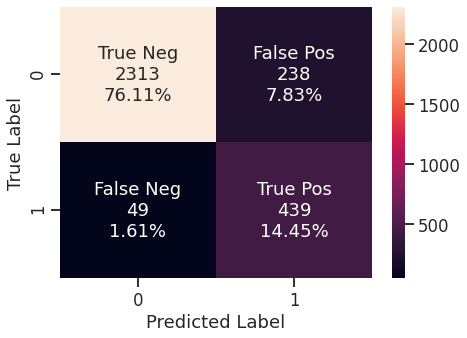

In [152]:
# Creating confusion matrix
make_confusion_matrix(pipe_XGB_GS, y_test)

In [153]:
pipe_XGB_GS_score = get_metrics_score(model = pipe_XGB_GS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.895
Test Accuracy           = 0.906
Average Train Recall    = 0.896
Test Recall             = 0.9
Average Train Precision = 0.621
Test Precision          = 0.648
Average Train F1 Score  = 0.733
Test F1 Score           = 0.754
ROC AUC Score           = 0.963


- Results for the Tuned (Grid Search) Gradient Boosting Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.895 | Test Accuracy = 0.906\
    Average Cross-validated Train Recall   = 0.896 | Test Recall   = 0.900

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.895 - 0.906). Average Cross-validated Train and Test Recalls are relatively close (range 0.896 - 0.900) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.900), meaning the model is doing a good job at identifying potential attrited Customers. The cross-validated test Recall with hyperparameters tuning using Grid Search stayed almost the same compared to the same classifier without tuning.

- Reference (previous results for the same model classifier with default hyperparameters):  6_XGB  : 0.894(CV Train Set Average) | 0.904(Test Set)

***
## 7. Hyperparameters Tuning using Randomized Search <a class="anchor" id="77"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
    
- Tune all the models using ramdonized search
- Use pipelines in hyperparameter tuning

In [154]:
# Initializing a List for Capturing the Running Time for each Tuned Model using Randomized Search
time_list_RS = []

In [155]:
# Amount of Random Search Iterations
random_search_samples = 50

### 7.1 - Hyperparameters Tuning - Decision Tree Classifier using Ramdomized Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_DTREE_RS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('DecisionTree', DecisionTreeClassifier(random_state = seed))])

# Parameter grid to pass in GridSearchCV
parameters = {'DecisionTree__max_depth' : sp_randint(1, 11),
              'DecisionTree__criterion' : ['entropy','gini'],
              'DecisionTree__splitter' : ['best','random'],
              'DecisionTree__min_samples_leaf' : sp_randint(1, 21),
              'DecisionTree__max_leaf_nodes' : sp_randint(1, 11),
              'DecisionTree__min_impurity_decrease' : np.arange(0, 0.5, 0.0005)}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
grid_cv = RandomizedSearchCV(estimator = pipe_DTREE_RS, param_distributions = parameters, scoring = scorer, n_iter = random_search_samples,
                             cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), random_state = seed, verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_DTREE_RS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_DTREE_RS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

DTREE_time = time() - tic
print("done in {:.3f}s".format(DTREE_time))

# Appending the Model Name and the Running Time into the time_list
time_list_RS.append(["Decision Tree", round(DTREE_time), test_recall])

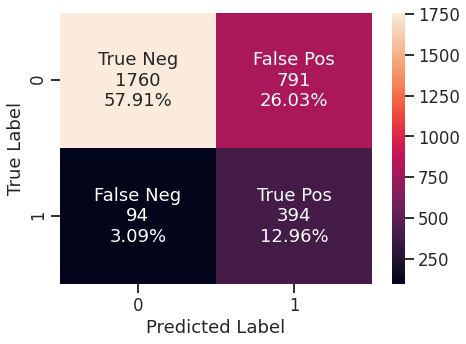

In [157]:
# Creating confusion matrix
make_confusion_matrix(pipe_DTREE_RS, y_test)

In [158]:
pipe_DTREE_RS_score = get_metrics_score(model = pipe_DTREE_RS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.729
Test Accuracy           = 0.709
Average Train Recall    = 0.858
Test Recall             = 0.807
Average Train Precision = 0.357
Test Precision          = 0.332
Average Train F1 Score  = 0.504
Test F1 Score           = 0.471
ROC AUC Score           = 0.804


- Results for the Tuned (Randomized Search) Decision Tree Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.729 | Test Accuracy = 0.709\
    Average Cross-validated Train Recall   = 0.858 | Test Recall   = 0.807

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.709 - 0.729). Average Cross-validated Train and Test Recalls are relatively close (range 0.858 - 0.807) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is not performing very well (Recall = 0.807). The Test Recall with hyperparameters tuning using Randomized Search decreased by ~6% compared to the same classifier with Grid Search tuning. 

- Reference (previous Grid Search results for the same model classifier with tuned hyperparameters): DTREE_GS - Average Cross-validated Train Recall = 0.893 | Test Recall = 0.859

### 7.2 - Hyperparameters Tuning - Random Forest Classifier using Randomized Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_RF_RS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('RandomForest', RandomForestClassifier(random_state = seed))])

# Parameter grid to pass in GridSearchCV
parameters = {'RandomForest__max_features': np.arange(0.1, 1.05, 0.05),
              'RandomForest__max_samples' : np.arange(0.1, 1.05, 0.05),
              'RandomForest__min_samples_leaf' : sp_randint(1, 11),
              'RandomForest__n_estimators' : sp_randint(1, 301)}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
grid_cv = RandomizedSearchCV(estimator = pipe_RF_RS, param_distributions = parameters, scoring = scorer,n_iter = random_search_samples,
                             cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), random_state = seed, verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_RF_RS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_RF_RS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

RF_time = time() - tic
print("done in {:.3f}s".format(RF_time))

# Appending the Model Name and the Running Time into the time_list
time_list_RS.append(["Random Forest", round(RF_time), test_recall])

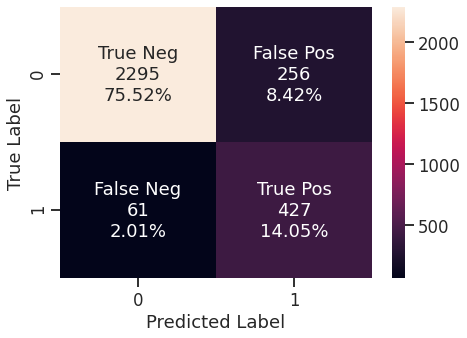

In [160]:
# Creating confusion matrix
make_confusion_matrix(pipe_RF_RS, y_test)

In [161]:
pipe_RF_RS_score = get_metrics_score(model = pipe_RF_RS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.889
Test Accuracy           = 0.896
Average Train Recall    = 0.896
Test Recall             = 0.875
Average Train Precision = 0.605
Test Precision          = 0.625
Average Train F1 Score  = 0.722
Test F1 Score           = 0.729
ROC AUC Score           = 0.953


- Results for the Tuned (Randomized Search) Random Forest Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.889 | Test Accuracy = 0.896\
    Average Cross-validated Train Recall   = 0.896 | Test Recall   = 0.875

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.889 - 0.896). Average Cross-validated Train and Test Recalls are relatively close (range 0.875 - 0.896) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.875). The Test Recall with hyperparameters tuning using Randomized Search is almost the same compared to the same classifier with Grid Search tuning. 

- Reference (previous Grid Search results for the same model classifier with tuned hyperparameters):  RF_GS - Average Cross-validated Train Recall = 0.893 | Test Recall = 0.873

### 7.3 - Hyperparameters Tuning - Bagging Classifier using Randomized Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_BC_RS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('Bagging', BaggingClassifier(random_state = seed))])

dtc = DecisionTreeClassifier(random_state = seed)
lr = LogisticRegression(random_state = seed)

# Grid of parameters to choose from
parameters = {'Bagging__base_estimator' : [dtc, lr],
              'Bagging__max_samples' : np.arange(0.1, 1.05, 0.05),
              'Bagging__max_features' : np.arange(0.1, 1.05, 0.05),
              'Bagging__n_estimators' : sp_randint(1, 100)}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
grid_cv = RandomizedSearchCV(estimator = pipe_BC_RS, param_distributions = parameters, scoring = scorer,n_iter = random_search_samples,
                             cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), random_state = seed, verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_BC_RS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_BC_RS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

BC_time = time() - tic
print("done in {:.3f}s".format(BC_time))

# Appending the Model Name and the Running Time into the time_list
time_list_RS.append(["Bagging", round(BC_time), test_recall])

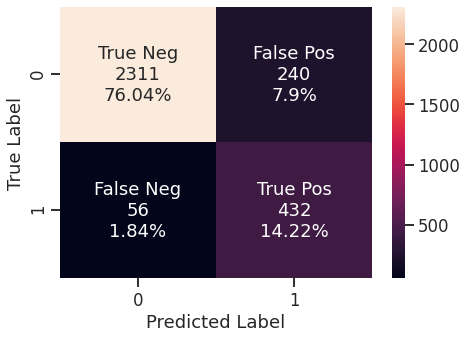

In [163]:
# Creating confusion matrix
make_confusion_matrix(pipe_BC_RS, y_test)

In [164]:
pipe_BC_RS_score = get_metrics_score(model = pipe_BC_RS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.893
Test Accuracy           = 0.903
Average Train Recall    = 0.888
Test Recall             = 0.885
Average Train Precision = 0.617
Test Precision          = 0.643
Average Train F1 Score  = 0.727
Test F1 Score           = 0.745
ROC AUC Score           = 0.961


- Results for the Tuned (Grid Search) Bagging Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.893 | Test Accuracy = 0.903\
    Average Cross-validated Train Recall   = 0.888 | Test Recall   = 0.885

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.893 - 0.903). Average Cross-validated Train and Test Recalls are relatively close (range 0.888 - 0.885) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.885). The Test Recall with hyperparameters tuning using Randomized Search increased by ~1% compared to the same classifier with Grid Search tuning. 

- Reference (previous Grid Search results for the same model classifier with tuned hyperparameters): BC_GS - Average Cross-validated Train Recall = 0.891 | Test Recall = 0.875

### 7.4 - Hyperparameters Tuning - Gradient Boosting Classifier using Randomized Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_GB_RS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('GradientBoosting', GradientBoostingClassifier(random_state = seed))])

# Grid of parameters to choose from
parameters = {"GradientBoosting__init" : [None, AdaBoostClassifier(random_state = 1)],
              "GradientBoosting__n_estimators": sp_randint(1, 200),
              "GradientBoosting__subsample": np.arange(0.1, 1.05, 0.05),
              "GradientBoosting__max_features": np.arange(0.1, 1.05, 0.05)}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
grid_cv = RandomizedSearchCV(estimator = pipe_GB_RS, param_distributions = parameters, scoring = scorer,n_iter = random_search_samples,
                             cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), random_state = seed, verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_GB_RS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_GB_RS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

GB_time = time() - tic
print("done in {:.3f}s".format(GB_time))

# Appending the Model Name and the Running Time into the time_list
time_list_RS.append(["Gradient Boosting", round(GB_time), test_recall])

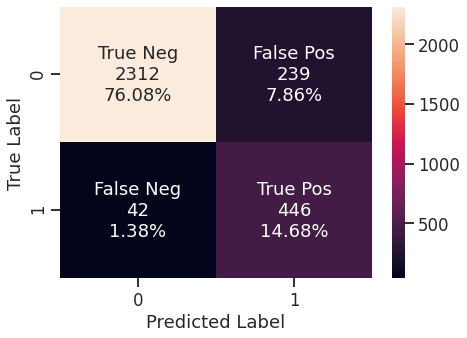

In [166]:
# Creating confusion matrix
make_confusion_matrix(pipe_GB_RS, y_test)

In [167]:
pipe_GB_RS_score = get_metrics_score(model = pipe_GB_RS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.899
Test Accuracy           = 0.908
Average Train Recall    = 0.898
Test Recall             = 0.914
Average Train Precision = 0.63
Test Precision          = 0.651
Average Train F1 Score  = 0.74
Test F1 Score           = 0.76
ROC AUC Score           = 0.965


- Results for the Tuned (Grid Search) Gradient Boosting Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.899 | Test Accuracy = 0.908\
    Average Cross-validated Train Recall   = 0.898 | Test Recall   = 0.914

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.899 - 0.908). Average Cross-validated Train and Test Recalls are relatively close (range 0.898 - 0.914) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.914). The Test Recall with hyperparameters tuning using Randomized Search increased by ~1% compared to the same classifier with Grid Search tuning.

- Reference (previous Grid Search results for the same model classifier with tuned hyperparameters):  GB_GS - Average Cross-validated Train Recall = 0.900 | Test Recall = 0.906

### 7.5 - Hyperparameters Tuning - Adaptive Boosting Classifier using Randomized Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_ADB_RS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('AdaBoost', AdaBoostClassifier(random_state = seed))])

# Grid of parameters to choose from
parameters = {"AdaBoost__base_estimator" : [DecisionTreeClassifier(max_depth = 1), DecisionTreeClassifier(max_depth = 2), DecisionTreeClassifier(max_depth = 3)],
              "AdaBoost__n_estimators" : sp_randint(1, 100),
              "AdaBoost__learning_rate" : np.arange(0.1, 1.05, 0.05)}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
grid_cv = RandomizedSearchCV(estimator = pipe_ADB_RS, param_distributions = parameters, scoring = scorer,n_iter = random_search_samples,
                             cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), random_state = seed, verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_ADB_RS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_ADB_RS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

ADB_time = time() - tic
print("done in {:.3f}s".format(ADB_time))

# Appending the Model Name and the Running Time into the time_list
time_list_RS.append(["Adaptive Boosting", round(ADB_time), test_recall])

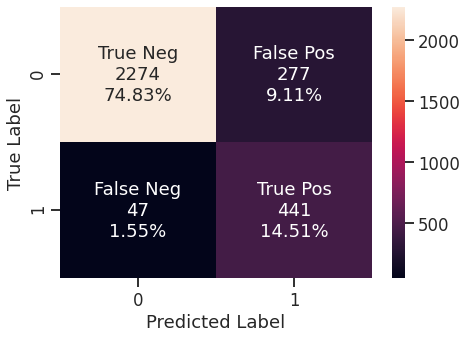

In [169]:
# Creating confusion matrix
make_confusion_matrix(pipe_ADB_RS, y_test)

In [170]:
pipe_ADB_RS_score = get_metrics_score(model = pipe_ADB_RS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.888
Test Accuracy           = 0.893
Average Train Recall    = 0.895
Test Recall             = 0.904
Average Train Precision = 0.602
Test Precision          = 0.614
Average Train F1 Score  = 0.719
Test F1 Score           = 0.731
ROC AUC Score           = 0.96


- Results for the Tuned (Randomized Search) Adaptive Boosting Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.888 | Test Accuracy = 0.893\
    Average Cross-validated Train Recall   = 0.895 | Test Recall   = 0.904

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.888 - 0.893). Average Cross-validated Train and Test Recalls are relatively close (range 0.895 - 0.904) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.904). The Test Recall with hyperparameters tuning using Randomized Search increased by ~1% compared to the same classifier with Grid Search tuning. 

- Reference (previous Grid Search results for the same model classifier with tuned hyperparameters): ADB_GS - Average Cross-validated Train Recall = 0.896 | Test Recall = 0.893

### 7.6 - Hyperparameters Tuning - XGBoost Classifier using Randomized Search

In [ ]:
# Start Counting the Running Time
tic = time()

# Creating pipeline
pipe_XGB_RS = Pipeline([('Under-sampling', RandomUnderSampler(random_state = seed)), ('Scaler', StandardScaler()), ('XGBoost', XGBClassifier(random_state = seed, eval_metric = "logloss"))])

# Grid of parameters to choose from
parameters = {"XGBoost__n_estimators" : sp_randint(1, 300),
              "XGBoost__subsample" : np.arange(0.1, 1.05, 0.05),
              "XGBoost__learning_rate" : np.arange(0.1, 1.05, 0.05),
              "XGBoost__gamma" : sp_randint(1, 11),
              "XGBoost__colsample_bylevel" : np.arange(0.1, 1.05, 0.05)}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
grid_cv = RandomizedSearchCV(estimator = pipe_XGB_RS, param_distributions = parameters, scoring = scorer, n_iter = random_search_samples,
                             cv = StratifiedKFold(n_splits = n_Folds, shuffle = True, random_state = seed), random_state = seed, verbose = 20)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pipe_XGB_RS = grid_cv.best_estimator_

# Test Recall Prediction with the Best Selected Model
y_pred_test = pipe_XGB_RS.predict(X_test)
test_recall = round(recall_score(y_test, y_pred_test), 3)

print()
print("Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_))
print()

XGB_time = time() - tic
print("done in {:.3f}s".format(XGB_time))

# Appending the Model Name and the Running Time into the time_list
time_list_RS.append(["XGBoosting", round(XGB_time), test_recall])

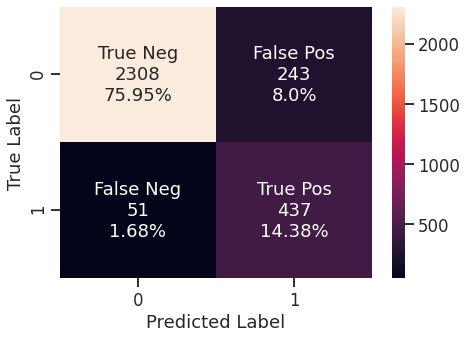

In [172]:
# Creating confusion matrix
make_confusion_matrix(pipe_XGB_RS, y_test)

In [173]:
pipe_XGB_RS_score = get_metrics_score(model = pipe_XGB_RS, n_splits = n_Folds, seed_splits = seed, flag = True)

Average Train Accuracy  = 0.894
Test Accuracy           = 0.903
Average Train Recall    = 0.894
Test Recall             = 0.895
Average Train Precision = 0.617
Test Precision          = 0.643
Average Train F1 Score  = 0.73
Test F1 Score           = 0.748
ROC AUC Score           = 0.962


- Results for the Tuned (Randomized Search) Gradient Boosting Classifier with Down-Sampling:

    Average Cross-validated Train Accuracy = 0.894 | Test Accuracy = 0.903\
    Average Cross-validated Train Recall   = 0.894 | Test Recall   = 0.895

- Average Cross-validated Train and Test Accuracies are relatively close (range 0.894 - 0.903). Average Cross-validated Train and Test Recalls are relatively close (range 0.894 - 0.895) - model is not exhibiting overfitting.

- The prediction for the Recall on the test set is performing very well (Recall = 0.895). The Test Recall with hyperparameters tuning using Randomized Search decreased by ~1% compared to the same classifier with Grid Search tuning.

- Reference (previous Grid Search results for the same model classifier with tuned hyperparameters):  XGB_GS - Average Cross-validated Train Recall   = 0.896 | Test Recall   = 0.900

***
## 8. Model Performances <a class="anchor" id="88"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
    
- Compare the model performance of all the models
- Comment on the time taken by the grid and randomized search in optimization

### 8.1 - Comparing the Performance for All the Models

In [174]:
# defining list of models
models = [pipe_DTREE_GS, pipe_RF_GS, pipe_BC_GS, pipe_GB_GS, pipe_ADB_GS, pipe_XGB_GS,
          pipe_DTREE_RS, pipe_RF_RS, pipe_BC_RS, pipe_GB_RS, pipe_ADB_RS, pipe_XGB_RS]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
F1_train = []
F1_test = []
ROC_AUC_score = []

# Looping through all the models to get the metrics
for model in models:
    j = get_metrics_score(model = model, n_splits = n_Folds, seed_splits = seed, flag = False)
    acc_train.append(np.round(j[0],3))
    acc_test.append(np.round(j[1],3))
    recall_train.append(np.round(j[2],3))
    recall_test.append(np.round(j[3],3))
    precision_train.append(np.round(j[4],3))
    precision_test.append(np.round(j[5],3))
    F1_train.append(np.round(j[6],3))
    F1_test.append(np.round(j[7],3))
    ROC_AUC_score.append(np.round(j[8],3))

In [175]:
# Creating a comparison dataframe with the metrics for all the models 
comparison_frame = pd.DataFrame({'Model':['Decision Tree Tuned with GridSearchCV', 'Random Forest Tuned with GridSearchCV', 'Bagging Classifier Tuned with GridSearchCV',
                                          'Gradient Boosting Tuned with GridSearchCV', 'Adaptive Boosting Tuned with GridSearchCV', 'XGBoost Tuned with GridSearchCV',
                                          'Decision Tree Tuned with RamdomizedSearchCV', 'Random Forest Tuned with RamdomizedSearchCV', 'Bagging Classifier Tuned with RamdomizedSearchCV',
                                          'Gradient Boosting Tuned with RamdomizedSearchCV', 'Adaptive Boosting Tuned with RamdomizedSearchCV', 'XGBoost Tuned with RamdomizedSearchCV'],
                                 'Average CV Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                 'Average CV Train_Recall':recall_train,'Test_Recall':recall_test,
                                 'Average CV Train_Precision':precision_train,'Test_Precision':precision_test,
                                 'Average CV Train_F1_Score':F1_train,'Test_F1_Score':F1_test,
                                 'ROC_AUC_Score':ROC_AUC_score}) 
comparison_frame

,Model,Average CV Train_Accuracy,Test_Accuracy,Average CV Train_Recall,Test_Recall,Average CV Train_Precision,Test_Precision,Average CV Train_F1_Score,Test_F1_Score,ROC_AUC_Score
0,Decision Tree Tuned with GridSearchCV,0.795,0.817,0.893,0.859,0.433,0.462,0.583,0.601,0.904
1,Random Forest Tuned with GridSearchCV,0.889,0.896,0.893,0.873,0.606,0.627,0.721,0.730,0.954
2,Bagging Classifier Tuned with GridSearchCV,0.894,0.896,0.893,0.877,0.619,0.627,0.731,0.731,0.954
3,Gradient Boosting Tuned with GridSearchCV,0.899,0.908,0.900,0.906,0.630,0.655,0.741,0.760,0.966
4,Adaptive Boosting Tuned with GridSearchCV,0.886,0.888,0.896,0.893,0.597,0.601,0.716,0.719,0.946
5,XGBoost Tuned with GridSearchCV,0.895,0.906,0.896,0.900,0.621,0.648,0.733,0.754,0.963
6,Decision Tree Tuned with RamdomizedSearchCV,0.729,0.709,0.858,0.807,0.357,0.332,0.504,0.471,0.804
7,Random Forest Tuned with RamdomizedSearchCV,0.889,0.896,0.896,0.875,0.605,0.625,0.722,0.729,0.953
8,Bagging Classifier Tuned with RamdomizedSearchCV,0.893,0.903,0.888,0.885,0.617,0.643,0.727,0.745,0.961
9,Gradient Boosting Tuned with RamdomizedSearchCV,0.899,0.908,0.898,0.914,0.630,0.651,0.740,0.760,0.965


In [176]:
# Sorting the models by F1-Score metric (ascending order)
comparison_frame.sort_values(["Test_Recall"], ascending = True, inplace = True)

In [177]:
# Data preparation to create a lineplot with a hue per metric
comparison_frame_melted = pd.melt(frame = comparison_frame, id_vars=['Model'], value_name = 'Metric Value')

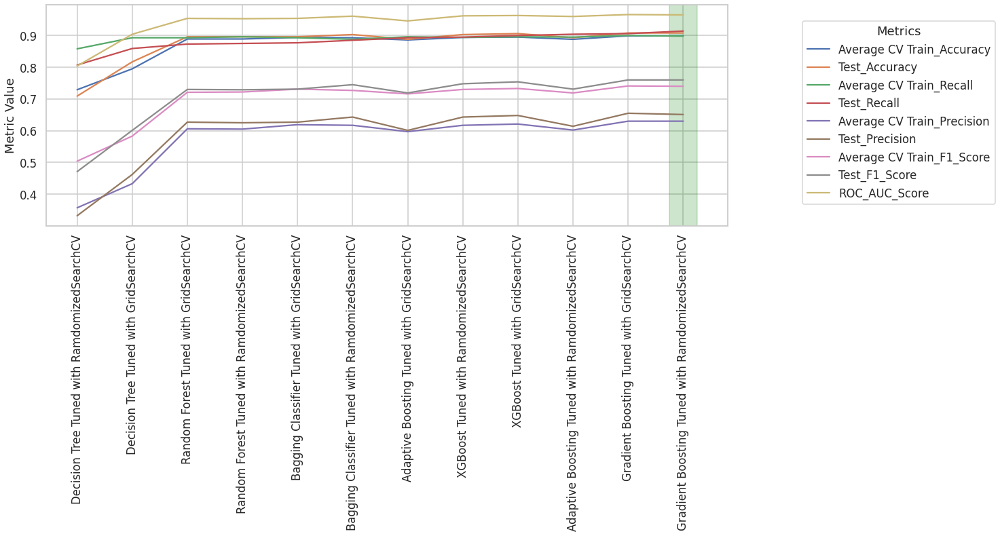

In [178]:
# Lineplot with a hue per metric for all the models, sorted by F1 Score on the Test Set
sns.set({'figure.figsize': (18,6)})
sns.set_style("whitegrid")
sns.set_context("talk")
chart = sns.lineplot(x = "Model", y = "Metric Value", hue = "variable", data = comparison_frame_melted)
chart.figure.canvas.draw()
x = chart.get_xticklabels()
chart.set_xticklabels(x, rotation = 90)
chart.legend(loc = 'upper right', title = 'Metrics', bbox_to_anchor=(1.4, 0.95))
chart.axvspan(10.75, 11.25, color = 'green', alpha = 0.2)
chart.set(xlabel = None);

- 'Gradient Boosting Tuned with RamdomizedSearchCV' presented the best performance and will be included in more detailed analysis as next steps.

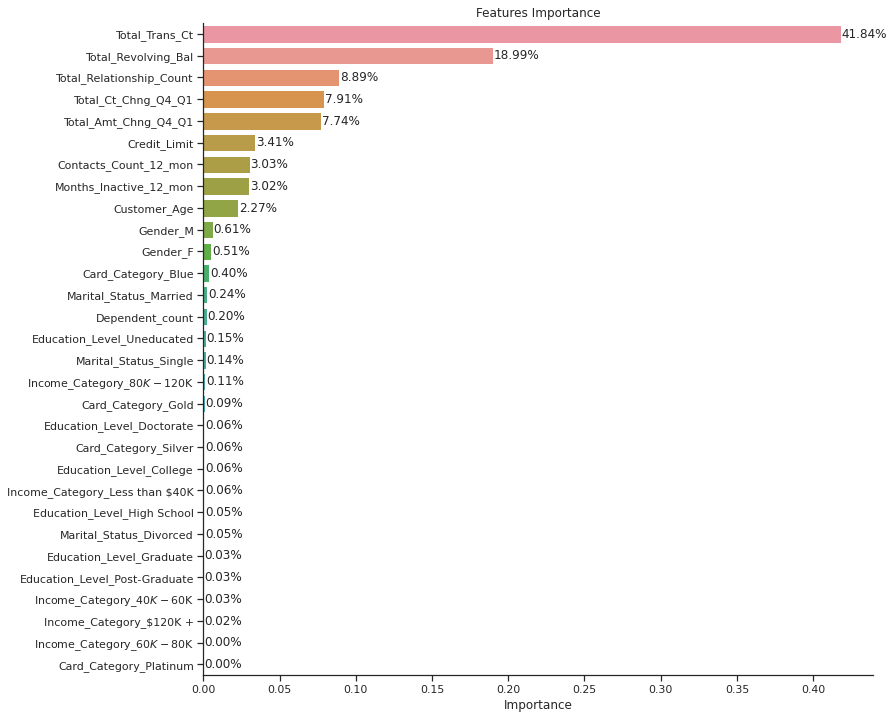

In [179]:
# Features Importance
features_importance(pipe_GB_RS._final_estimator)

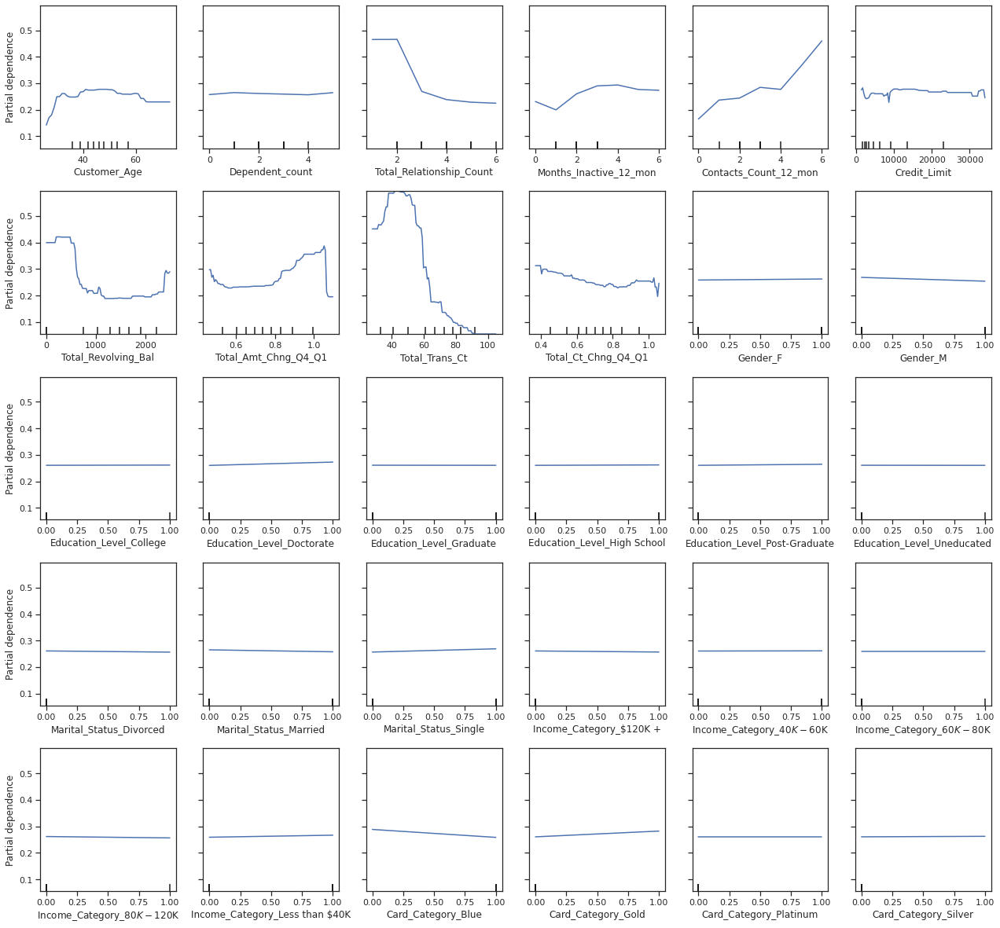

In [180]:
# Creation of Partial Dependence Plot for all Variables
# Partial Dependence Plots (PDP) show the dependence between the target response and a set of input features of interest.
# Intuitively, we can interpret the partial dependence as the expected target response as a function of the input features of interest.
feature_names = list(X_train.columns)
plot_partial_dependence(estimator = pipe_GB_RS, X = X_train, features = feature_names, n_cols = 6)
fig = plt.gcf()
fig.subplots_adjust(left = 0, right = 1.4, bottom = 0.01, hspace = 0.3)
fig.set_figheight(18)

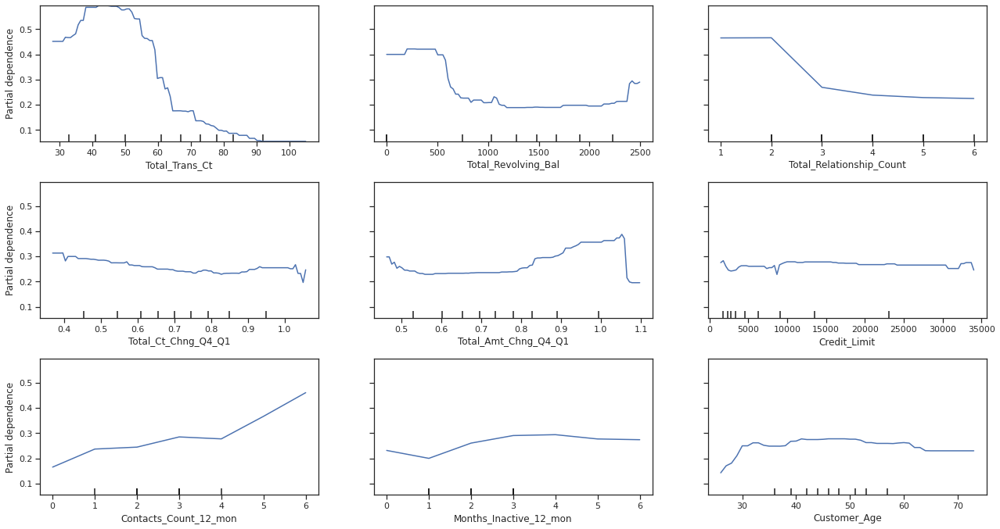

In [181]:
# Creation of Partial Dependence Plot for Top 09 Variables
feature_names = ['Total_Trans_Ct', 'Total_Revolving_Bal' , 'Total_Relationship_Count', 'Total_Ct_Chng_Q4_Q1', 'Total_Amt_Chng_Q4_Q1',
                 'Credit_Limit', 'Contacts_Count_12_mon', 'Months_Inactive_12_mon', 'Customer_Age']
plot_partial_dependence(estimator = pipe_GB_RS, X = X_train, features = feature_names, n_cols = 3)
fig = plt.gcf()
fig.subplots_adjust(left = 0, right = 1.4, bottom = 0.01, hspace = 0.3)
fig.set_figheight(10)

- In comparison to all other models and tuning strategies, the 'Gradient Boosting Tuned with RamdomizedSearchCV' got the best performance for the Test Recall. Its Average Cross-validated Train and Test Accuracies were relatively close (range 0.899 - 0.908), and its Average Cross-validated Train and Test Recalls were relatively close (range 0.898 - 0.914). Also, it didn't exhibit overfitting, conveying the model is likely to generalize well for production purpose.

- The most relevant variables for the model are: 'Total_Trans_Ct', 'Total_Revolving_Bal' , 'Total_Relationship_Count', 'Total_Ct_Chng_Q4_Q1', 'Total_Amt_Chng_Q4_Q1', 'Credit_Limit', 'Contacts_Count_12_mon', 'Months_Inactive_12_mon' and 'Customer_Age'.

### 8.2 - Comparing the Runing Time and Performance for All the Models (Grid Search vs. Random Search

In [182]:
# Creating a Merged Dataframe for the Ruuning Time and Test Recall for All Models GRid Search and Randomized Search Tunings
run_time_GS = pd.DataFrame(time_list_GS, columns = ["Classifier", "Run Time Grid Search (s)", "Test Set Recall Grid Search"])
run_time_RS = pd.DataFrame(time_list_RS, columns = ["Classifier", "Run Time Random Search (s)", "Test Set Recall Random Search"])
run_time_recall = pd.merge(run_time_GS, run_time_RS, how = "inner", on = "Classifier")

In [183]:
# Calculation the Time Reduction % (Randomized Search vs. Grid Search) and the Recall Ratio (Test Set Recall Randomized Search / Grid Search)
run_time_recall["Run Time Reduction %"] = round(100 * (1 - (run_time_recall["Run Time Random Search (s)"] / run_time_recall["Run Time Grid Search (s)"])), 2)
run_time_recall["RS & GS Test Recall Ratio"] = round((run_time_recall["Test Set Recall Random Search"] / run_time_recall["Test Set Recall Grid Search"]), 2)
run_time_recall

,Classifier,Run Time Grid Search (s),Test Set Recall Grid Search,Run Time Random Search (s),Test Set Recall Random Search,Run Time Reduction %,RS & GS Test Recall Ratio
0,Decision Tree,173,0.859,6,0.807,96.53,0.94
1,Random Forest,370,0.873,120,0.875,67.57,1.00
2,Bagging,334,0.877,156,0.885,53.29,1.01
3,Gradient Boosting,240,0.906,77,0.914,67.92,1.01
4,Adaptive Boosting,132,0.893,52,0.904,60.61,1.01
5,XGBoosting,1117,0.900,103,0.895,90.78,0.99


- By comparing Ramdomized Search with Grid Search, there was a substantial run time reduction for all the models tuned with Randomized Search (reduction range from ~50% to ~95% - see table above). It's important to mention that this reduction in running time is directly proportional to the number of iterations used for the Ramdomized Search. The choice for the amount of iterations (50 iterations) was based on the Test Set Recall performance (see 'RS & GS Test Recall Ratio' on the table above).

- The Test Set Recall performance from all the models tuned thru Grid Search and Random Search didn't vary too much. In some cases (Bagging, Gradient Boosting and Adaptive Boosting) the Test Set Recall had a minor improvement (\~1% improvement) for the Randomized Search. With that, the 'Gradient Boosting Tuned with RamdomizedSearchCV' not only got the best performance for Test Recall but also had a substantial reduction on runing time (\~65% reduction).

***
## 9. Actionable Insights & Recommendations <a class="anchor" id="99"></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:blue;">
- Business recommendations and insights

### 9.1 - Business Recommendations

- 'Total_Trans_Ct' or the total transaction count along the last 12 months is the most relevant variable and has a negative slope as per the Partial Dependence Plot. This means that Customers who don't use their credit cards too often (less transactions count) are more likely to quit the bank credit card service. Here a recommendation to the back would be to explore alternatives to increase their credit card usage frequency by the Customers. Some options for that could be:
    
    - Give rebates - card issuers have been very successful with rewards programs that give Customers various rebates or points when using their cards.
    - Upgrade account management tools - give to the Customers access to advanced features like fraud alerts, payment reminders, paperless statements and mobile payments. It will not only help them manage their accounts more easily and conveniently, but it will also make the bank like a “real” card issuer, not one who’s doing it as a sideshow.


- 'Total_Revolving_Bal' is the 2nd most significant variable and also has a negative slope as per the Partial Dependence Plot. This means that Customers with less revolving balance are more likely to quit the bank credit card service. The revolving balance is the balance carried over amount from one month to the other if the Customer doesn't pay the full balance. A possible option to increase the amount of revolving balances (and consequently reduce the amount of attrited Customers) could be to offer the Customers more attractive payment terms, or extending the promotional terms to make the minimum payment option a more appealing one to them.

- 'Total_Relationship_Count' is the 3rd most significant variable and also has a negative slope as per the Partial Dependence Plot. This means that Customers with less held products at the bank are more likely to quit the bank credit card service. A possible option would be to offer to the Customers co-branded debit card or other kind of products which would make grow/improve the relationship with the bank, and consequently reduce the amount of attrited Customers.

- Regarding 'Total_Ct_Chng_Q4_Q1' and 'Total_Amt_Chng_Q4_Q1', the best balance to reduce the likelihood for attrition would require the Customers to get a more balanced amount of transactions between Q4 and Q1 (Q4/Q1 transaction count ~ 1), and a expenditure amount ratio (Q4/Q1 expenditure) between 0.6 - 0.8 or 60% to 80% less expenses in Q4 compared to Q1. These variables a highly dependent on the Customer usage habits but there might be some options offered by the bank that could potentially influence that.

- 'Contact_Count_12_mon' also has some significance to Customer attrition. Its slope as per the Partial Dependence Plot is positive, meaning that more bi-directional conversations between the bank and the Customer are more likely to cause attrition or making the Customers quit the bank credit card service. In this case, a possible way to reduce attrition would be turn the contact process less frequent by improving the quality of the services (less complaints or Customer-to-bank interactions). A detailed analysis of these bi-directional conversations should be taken into account to enable a better understanding on how to improve the process.